In [18]:
import matplotlib
import numpy as np
import keras
from keras import backend as K
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import *
from keras.optimizers import SGD, RMSprop, Adam
from keras_preprocessing.image import ImageDataGenerator
from keras.layers.normalization import BatchNormalization
import itertools
import matplotlib.pyplot as plt
%matplotlib inline

/home/student/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [3]:
!wget "https://s3-us-west-1.amazonaws.com/places-image-dataset/Image/Dataset.zip"


--2018-10-23 21:43:18--  https://s3-us-west-1.amazonaws.com/places-image-dataset/Image/Dataset.zip
Resolving s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)... 52.219.20.89
Connecting to s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)|52.219.20.89|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2508774431 (2.3G) [application/zip]
Saving to: ‘Dataset.zip’

Dataset.zip         100%[===================>]   2.34G  72.3MB/s    in 37s     

2018-10-23 21:43:55 (64.7 MB/s) - ‘Dataset.zip’ saved [2508774431/2508774431]



In [4]:
!unzip Dataset.zip

Archive:  Dataset.zip
   creating: Dataset/
  inflating: Dataset/.DS_Store       
   creating: __MACOSX/
   creating: __MACOSX/Dataset/
  inflating: __MACOSX/Dataset/._.DS_Store  
   creating: Dataset/Test/
  inflating: Dataset/Test/.DS_Store  
   creating: __MACOSX/Dataset/Test/
  inflating: __MACOSX/Dataset/Test/._.DS_Store  
   creating: Dataset/Test/airport_inside/
  inflating: Dataset/Test/airport_inside/airport_inside_0092.jpg  
   creating: __MACOSX/Dataset/Test/airport_inside/
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0092.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0093.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0093.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0094.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0094.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0095.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0095.jpg

  inflating: Dataset/Test/airport_inside/airport_inside_0159.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0159.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0160.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0160.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0161.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0161.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0162.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0162.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0163.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0163.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0164.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_inside_0164.jpg  
  inflating: Dataset/Test/airport_inside/airport_inside_0165.jpg  
  inflating: __MACOSX/Dataset/Test/airport_inside/._airport_ins

  inflating: Dataset/Test/auditorium/amphitheatre_2__86.jpg  
  inflating: __MACOSX/Dataset/Test/auditorium/._amphitheatre_2__86.jpg  
  inflating: Dataset/Test/auditorium/amphitheatre_bastille_1__23.jpg  
  inflating: __MACOSX/Dataset/Test/auditorium/._amphitheatre_bastille_1__23.jpg  
  inflating: Dataset/Test/auditorium/amphitheatre_cite_internationale_lyon_1__26.jpg  
  inflating: __MACOSX/Dataset/Test/auditorium/._amphitheatre_cite_internationale_lyon_1__26.jpg  
  inflating: Dataset/Test/auditorium/amphivide_1__87.jpg  
  inflating: __MACOSX/Dataset/Test/auditorium/._amphivide_1__87.jpg  
  inflating: Dataset/Test/auditorium/anderson_1__88.jpg  
  inflating: __MACOSX/Dataset/Test/auditorium/._anderson_1__88.jpg  
  inflating: Dataset/Test/auditorium/audit400_1__89.jpg  
  inflating: __MACOSX/Dataset/Test/auditorium/._audit400_1__89.jpg  
  inflating: Dataset/Test/auditorium/auditor_1__90.jpg  
  inflating: __MACOSX/Dataset/Test/auditorium/._auditor_1__90.jpg  
  inflating: Datase

  inflating: __MACOSX/Dataset/Test/bar/._bar_0111.jpg  
  inflating: Dataset/Test/bar/bar_0112.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0112.jpg  
  inflating: Dataset/Test/bar/bar_0113.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0113.jpg  
  inflating: Dataset/Test/bar/bar_0114.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0114.jpg  
  inflating: Dataset/Test/bar/bar_0115.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0115.jpg  
  inflating: Dataset/Test/bar/bar_0116.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0116.jpg  
  inflating: Dataset/Test/bar/bar_0117.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0117.jpg  
  inflating: Dataset/Test/bar/bar_0118.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0118.jpg  
  inflating: Dataset/Test/bar/bar_0119.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0119.jpg  
  inflating: Dataset/Test/bar/bar_0120.jpg  
  inflating: __MACOSX/Dataset/Test/bar/._bar_0120.jpg  
  inflating: Dataset/Test/bar/bar_0

  inflating: Dataset/Test/bathroom/IMG_0076.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._IMG_0076.jpg  
  inflating: Dataset/Test/bathroom/img_0646.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._img_0646.jpg  
  inflating: Dataset/Test/bathroom/IMG_0999.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._IMG_0999.jpg  
  inflating: Dataset/Test/bathroom/IMG_1005.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._IMG_1005.jpg  
  inflating: Dataset/Test/bathroom/IMG_1084.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._IMG_1084.jpg  
  inflating: Dataset/Test/bathroom/IMG_1085.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._IMG_1085.jpg  
  inflating: Dataset/Test/bathroom/img_1115.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._img_1115.jpg  
  inflating: Dataset/Test/bathroom/IMG_1252.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._IMG_1252.jpg  
  inflating: Dataset/Test/bathroom/IMG_1253.jpg  
  inflating: __MACOSX/Dataset/Test/bathroom/._IMG_1253.jpg  
 

  inflating: Dataset/Test/bedroom/IMG_3265.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._IMG_3265.jpg  
  inflating: Dataset/Test/bedroom/IMG_3274.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._IMG_3274.jpg  
  inflating: Dataset/Test/bedroom/IMG_3699.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._IMG_3699.jpg  
  inflating: Dataset/Test/bedroom/IMG_3737.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._IMG_3737.jpg  
  inflating: Dataset/Test/bedroom/img_378.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._img_378.jpg  
  inflating: Dataset/Test/bedroom/img_407.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._img_407.jpg  
  inflating: Dataset/Test/bedroom/IMG_4828.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._IMG_4828.jpg  
  inflating: Dataset/Test/bedroom/IMG_4829.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._IMG_4829.jpg  
  inflating: Dataset/Test/bedroom/IMG_4830.jpg  
  inflating: __MACOSX/Dataset/Test/bedroom/._IMG_4830.jpg  
  inflating: Dataset/Te

  inflating: Dataset/Test/bowling/bowling_0036.jpg  
  inflating: __MACOSX/Dataset/Test/bowling/._bowling_0036.jpg  
  inflating: Dataset/Test/bowling/bowling_0037.jpg  
  inflating: __MACOSX/Dataset/Test/bowling/._bowling_0037.jpg  
  inflating: Dataset/Test/bowling/bowling_0038.jpg  
  inflating: __MACOSX/Dataset/Test/bowling/._bowling_0038.jpg  
  inflating: Dataset/Test/bowling/bowling_0039.jpg  
  inflating: __MACOSX/Dataset/Test/bowling/._bowling_0039.jpg  
  inflating: Dataset/Test/bowling/bowling_0040.jpg  
  inflating: __MACOSX/Dataset/Test/bowling/._bowling_0040.jpg  
  inflating: Dataset/Test/bowling/bowling_0041.jpg  
  inflating: __MACOSX/Dataset/Test/bowling/._bowling_0041.jpg  
  inflating: Dataset/Test/bowling/bowling_0042.jpg  
  inflating: __MACOSX/Dataset/Test/bowling/._bowling_0042.jpg  
  inflating: Dataset/Test/bowling/bowling_0043.jpg  
  inflating: __MACOSX/Dataset/Test/bowling/._bowling_0043.jpg  
  inflating: Dataset/Test/bowling/bowling_0044.jpg  
  inflating

  inflating: Dataset/Test/church_inside/church234567.jpg  
  inflating: __MACOSX/Dataset/Test/church_inside/._church234567.jpg  
  inflating: Dataset/Test/church_inside/Church_Interior.jpg  
  inflating: __MACOSX/Dataset/Test/church_inside/._Church_Interior.jpg  
  inflating: Dataset/Test/church_inside/Church_interior_1_.jpg  
  inflating: __MACOSX/Dataset/Test/church_inside/._Church_interior_1_.jpg  
  inflating: Dataset/Test/church_inside/churchinside.jpg  
  inflating: __MACOSX/Dataset/Test/church_inside/._churchinside.jpg  
  inflating: Dataset/Test/church_inside/churchinside01.jpg  
  inflating: __MACOSX/Dataset/Test/church_inside/._churchinside01.jpg  
  inflating: Dataset/Test/church_inside/churchinterior02.jpg  
  inflating: __MACOSX/Dataset/Test/church_inside/._churchinterior02.jpg  
  inflating: Dataset/Test/church_inside/churchinterior03.jpg  
  inflating: __MACOSX/Dataset/Test/church_inside/._churchinterior03.jpg  
  inflating: Dataset/Test/church_inside/Columb_Eglise_int1.

  inflating: Dataset/Test/computerroom/biblioteca_salamultimedia_g.jpg  
  inflating: __MACOSX/Dataset/Test/computerroom/._biblioteca_salamultimedia_g.jpg  
  inflating: Dataset/Test/computerroom/board05e.jpg  
  inflating: __MACOSX/Dataset/Test/computerroom/._board05e.jpg  
  inflating: Dataset/Test/computerroom/CEJBA_sala_camputadoras.jpg  
  inflating: __MACOSX/Dataset/Test/computerroom/._CEJBA_sala_camputadoras.jpg  
  inflating: Dataset/Test/computerroom/cip_pool.jpg  
  inflating: __MACOSX/Dataset/Test/computerroom/._cip_pool.jpg  
  inflating: Dataset/Test/computerroom/comp8.jpg  
  inflating: __MACOSX/Dataset/Test/computerroom/._comp8.jpg  
  inflating: Dataset/Test/computerroom/CompLab.jpg  
  inflating: __MACOSX/Dataset/Test/computerroom/._CompLab.jpg  
  inflating: Dataset/Test/computerroom/comproom3456.jpg  
  inflating: __MACOSX/Dataset/Test/computerroom/._comproom3456.jpg  
  inflating: Dataset/Test/computerroom/comproom348.jpg  
  inflating: __MACOSX/Dataset/Test/compute

  inflating: __MACOSX/Dataset/Test/deli/._deli_09_10_yahoo.jpg  
  inflating: Dataset/Test/deli/deli_1.jpg  
  inflating: __MACOSX/Dataset/Test/deli/._deli_1.jpg  
  inflating: Dataset/Test/deli/deli_100_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/deli/._deli_100_06_flickr.jpg  
  inflating: Dataset/Test/deli/deli_100_17_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/deli/._deli_100_17_flickr.jpg  
  inflating: Dataset/Test/deli/deli_101_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/deli/._deli_101_06_flickr.jpg  
  inflating: Dataset/Test/deli/deli_102_11_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/deli/._deli_102_11_flickr.jpg  
  inflating: Dataset/Test/deli/deli_103_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/deli/._deli_103_06_flickr.jpg  
  inflating: Dataset/Test/deli/deli_103_09_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/deli/._deli_103_09_flickr.jpg  
  inflating: Dataset/Test/deli/deli_103_13_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/deli/._

  inflating: Dataset/Test/dining_room/dining019.jpg  
  inflating: __MACOSX/Dataset/Test/dining_room/._dining019.jpg  
  inflating: Dataset/Test/dining_room/dining020.jpg  
  inflating: __MACOSX/Dataset/Test/dining_room/._dining020.jpg  
  inflating: Dataset/Test/dining_room/dining021.jpg  
  inflating: __MACOSX/Dataset/Test/dining_room/._dining021.jpg  
  inflating: Dataset/Test/dining_room/dining022.jpg  
  inflating: __MACOSX/Dataset/Test/dining_room/._dining022.jpg  
  inflating: Dataset/Test/dining_room/dining023.jpg  
  inflating: __MACOSX/Dataset/Test/dining_room/._dining023.jpg  
  inflating: Dataset/Test/dining_room/dining024.jpg  
  inflating: __MACOSX/Dataset/Test/dining_room/._dining024.jpg  
  inflating: Dataset/Test/dining_room/dining025.jpg  
  inflating: __MACOSX/Dataset/Test/dining_room/._dining025.jpg  
  inflating: Dataset/Test/dining_room/dining026.jpg  
  inflating: __MACOSX/Dataset/Test/dining_room/._dining026.jpg  
  inflating: Dataset/Test/dining_room/dining028.

  inflating: Dataset/Test/gameroom/gameroom.jpg  
  inflating: __MACOSX/Dataset/Test/gameroom/._gameroom.jpg  
  inflating: Dataset/Test/gameroom/Gameroom021.jpg  
  inflating: __MACOSX/Dataset/Test/gameroom/._Gameroom021.jpg  
  inflating: Dataset/Test/gameroom/Gameroom022.jpg  
  inflating: __MACOSX/Dataset/Test/gameroom/._Gameroom022.jpg  
  inflating: Dataset/Test/gameroom/gameroom2.jpg  
  inflating: __MACOSX/Dataset/Test/gameroom/._gameroom2.jpg  
  inflating: Dataset/Test/gameroom/gameroom2_600x448.jpg  
  inflating: __MACOSX/Dataset/Test/gameroom/._gameroom2_600x448.jpg  
  inflating: Dataset/Test/gameroom/Gameroom3.jpg  
  inflating: __MACOSX/Dataset/Test/gameroom/._Gameroom3.jpg  
  inflating: Dataset/Test/gameroom/gameroom4.jpg  
  inflating: __MACOSX/Dataset/Test/gameroom/._gameroom4.jpg  
  inflating: Dataset/Test/gameroom/GameRoom45.jpg  
  inflating: __MACOSX/Dataset/Test/gameroom/._GameRoom45.jpg  
  inflating: Dataset/Test/gameroom/gameroom688.jpg  
  inflating: __MACO

  inflating: Dataset/Test/gym/gimnasio_10_03_altavista.jpg  
   creating: __MACOSX/Dataset/Test/gym/
  inflating: __MACOSX/Dataset/Test/gym/._gimnasio_10_03_altavista.jpg  
  inflating: Dataset/Test/gym/gimnasio_10_08_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/gym/._gimnasio_10_08_altavista.jpg  
  inflating: Dataset/Test/gym/gimnasio_10_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/gym/._gimnasio_10_11_altavista.jpg  
  inflating: Dataset/Test/gym/gimnasio_10_20_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/gym/._gimnasio_10_20_altavista.jpg  
  inflating: Dataset/Test/gym/gimnasio_11_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/gym/._gimnasio_11_12_altavista.jpg  
  inflating: Dataset/Test/gym/gimnasio_11_16_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/gym/._gimnasio_11_16_altavista.jpg  
  inflating: Dataset/Test/gym/gimnasio_11_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/gym/._gimnasio_11_18_altavista.jpg  
  inflating: Dataset/Test/gym

  inflating: Dataset/Test/inside_subway/inside_subway_0096.jpg  
  inflating: __MACOSX/Dataset/Test/inside_subway/._inside_subway_0096.jpg  
  inflating: Dataset/Test/inside_subway/inside_subway_0097.jpg  
  inflating: __MACOSX/Dataset/Test/inside_subway/._inside_subway_0097.jpg  
  inflating: Dataset/Test/inside_subway/inside_subway_0098.jpg  
  inflating: __MACOSX/Dataset/Test/inside_subway/._inside_subway_0098.jpg  
  inflating: Dataset/Test/inside_subway/inside_subway_0099.jpg  
  inflating: __MACOSX/Dataset/Test/inside_subway/._inside_subway_0099.jpg  
  inflating: Dataset/Test/inside_subway/inside_subway_0100.jpg  
  inflating: __MACOSX/Dataset/Test/inside_subway/._inside_subway_0100.jpg  
  inflating: Dataset/Test/inside_subway/inside_subway_0101.jpg  
  inflating: __MACOSX/Dataset/Test/inside_subway/._inside_subway_0101.jpg  
  inflating: Dataset/Test/inside_subway/inside_subway_0102.jpg  
  inflating: __MACOSX/Dataset/Test/inside_subway/._inside_subway_0102.jpg  
  inflating: 

  inflating: Dataset/Test/kindergarden/Classroom566.jpg  
   creating: __MACOSX/Dataset/Test/kindergarden/
  inflating: __MACOSX/Dataset/Test/kindergarden/._Classroom566.jpg  
  inflating: Dataset/Test/kindergarden/classroom8.jpg  
  inflating: __MACOSX/Dataset/Test/kindergarden/._classroom8.jpg  
  inflating: Dataset/Test/kindergarden/classroom_1.jpg  
  inflating: __MACOSX/Dataset/Test/kindergarden/._classroom_1.jpg  
  inflating: Dataset/Test/kindergarden/Classroom_109.jpg  
  inflating: __MACOSX/Dataset/Test/kindergarden/._Classroom_109.jpg  
  inflating: Dataset/Test/kindergarden/classroom_large2.jpg  
  inflating: __MACOSX/Dataset/Test/kindergarden/._classroom_large2.jpg  
  inflating: Dataset/Test/kindergarden/classroom_north_bmp.jpg  
  inflating: __MACOSX/Dataset/Test/kindergarden/._classroom_north_bmp.jpg  
  inflating: Dataset/Test/kindergarden/classroom_october.jpg  
  inflating: __MACOSX/Dataset/Test/kindergarden/._classroom_october.jpg  
  inflating: Dataset/Test/kinderga

  inflating: Dataset/Test/kitchen/indoor_0281.jpg  
  inflating: __MACOSX/Dataset/Test/kitchen/._indoor_0281.jpg  
  inflating: Dataset/Test/kitchen/indoor_0282.jpg  
  inflating: __MACOSX/Dataset/Test/kitchen/._indoor_0282.jpg  
  inflating: Dataset/Test/kitchen/indoor_0283.jpg  
  inflating: __MACOSX/Dataset/Test/kitchen/._indoor_0283.jpg  
  inflating: Dataset/Test/kitchen/indoor_0300.jpg  
  inflating: __MACOSX/Dataset/Test/kitchen/._indoor_0300.jpg  
  inflating: Dataset/Test/kitchen/indoor_0301.jpg  
  inflating: __MACOSX/Dataset/Test/kitchen/._indoor_0301.jpg  
  inflating: Dataset/Test/kitchen/indoor_0302.jpg  
  inflating: __MACOSX/Dataset/Test/kitchen/._indoor_0302.jpg  
  inflating: Dataset/Test/kitchen/indoor_0318.jpg  
  inflating: __MACOSX/Dataset/Test/kitchen/._indoor_0318.jpg  
  inflating: Dataset/Test/kitchen/indoor_0319.jpg  
  inflating: __MACOSX/Dataset/Test/kitchen/._indoor_0319.jpg  
  inflating: Dataset/Test/kitchen/indoor_0320.jpg  
  inflating: __MACOSX/Datase

  inflating: __MACOSX/Dataset/Test/livingroom/._family24.jpg  
  inflating: Dataset/Test/livingroom/family34.jpg  
  inflating: __MACOSX/Dataset/Test/livingroom/._family34.jpg  
  inflating: Dataset/Test/livingroom/family45.jpg  
  inflating: __MACOSX/Dataset/Test/livingroom/._family45.jpg  
  inflating: Dataset/Test/livingroom/family48.jpg  
  inflating: __MACOSX/Dataset/Test/livingroom/._family48.jpg  
  inflating: Dataset/Test/livingroom/family49.jpg  
  inflating: __MACOSX/Dataset/Test/livingroom/._family49.jpg  
  inflating: Dataset/Test/livingroom/family61.jpg  
  inflating: __MACOSX/Dataset/Test/livingroom/._family61.jpg  
  inflating: Dataset/Test/livingroom/family7.jpg  
  inflating: __MACOSX/Dataset/Test/livingroom/._family7.jpg  
  inflating: Dataset/Test/livingroom/family81.jpg  
  inflating: __MACOSX/Dataset/Test/livingroom/._family81.jpg  
  inflating: Dataset/Test/livingroom/familyroom22.jpg  
  inflating: __MACOSX/Dataset/Test/livingroom/._familyroom22.jpg  
  inflating

  inflating: Dataset/Test/locker_room/locker_room_google_0047.jpg  
  inflating: __MACOSX/Dataset/Test/locker_room/._locker_room_google_0047.jpg  
  inflating: Dataset/Test/locker_room/locker_room_google_0048.jpg  
  inflating: __MACOSX/Dataset/Test/locker_room/._locker_room_google_0048.jpg  
  inflating: Dataset/Test/locker_room/locker_room_google_0049.jpg  
  inflating: __MACOSX/Dataset/Test/locker_room/._locker_room_google_0049.jpg  
  inflating: Dataset/Test/locker_room/locker_room_google_0050.jpg  
  inflating: __MACOSX/Dataset/Test/locker_room/._locker_room_google_0050.jpg  
  inflating: Dataset/Test/locker_room/locker_room_google_0051.jpg  
  inflating: __MACOSX/Dataset/Test/locker_room/._locker_room_google_0051.jpg  
  inflating: Dataset/Test/locker_room/locker_room_google_0052.jpg  
  inflating: __MACOSX/Dataset/Test/locker_room/._locker_room_google_0052.jpg  
  inflating: Dataset/Test/locker_room/locker_room_google_0053.jpg  
  inflating: __MACOSX/Dataset/Test/locker_room/._l

  inflating: Dataset/Test/movietheater/auditorium852_41.jpg  
  inflating: __MACOSX/Dataset/Test/movietheater/._auditorium852_41.jpg  
  inflating: Dataset/Test/movietheater/auditorium913_17.jpg  
  inflating: __MACOSX/Dataset/Test/movietheater/._auditorium913_17.jpg  
  inflating: Dataset/Test/movietheater/auditorium_resized_18.jpg  
  inflating: __MACOSX/Dataset/Test/movietheater/._auditorium_resized_18.jpg  
  inflating: Dataset/Test/movietheater/big_daf36b3715dd4d6cfdfe52fa07d544f7_1__42.jpg  
  inflating: __MACOSX/Dataset/Test/movietheater/._big_daf36b3715dd4d6cfdfe52fa07d544f7_1__42.jpg  
  inflating: Dataset/Test/movietheater/CCP0014467_P.jpg  
  inflating: __MACOSX/Dataset/Test/movietheater/._CCP0014467_P.jpg  
  inflating: Dataset/Test/movietheater/ccs_3_1__19.jpg  
  inflating: __MACOSX/Dataset/Test/movietheater/._ccs_3_1__19.jpg  
  inflating: Dataset/Test/movietheater/cine.jpg  
  inflating: __MACOSX/Dataset/Test/movietheater/._cine.jpg  
  inflating: Dataset/Test/moviethea

  inflating: Dataset/Test/office/homeoff007.jpg  
  inflating: __MACOSX/Dataset/Test/office/._homeoff007.jpg  
  inflating: Dataset/Test/office/homeoff008.jpg  
  inflating: __MACOSX/Dataset/Test/office/._homeoff008.jpg  
  inflating: Dataset/Test/office/homeoff009.jpg  
  inflating: __MACOSX/Dataset/Test/office/._homeoff009.jpg  
  inflating: Dataset/Test/office/homeoff011.jpg  
  inflating: __MACOSX/Dataset/Test/office/._homeoff011.jpg  
  inflating: Dataset/Test/office/homeoff012.jpg  
  inflating: __MACOSX/Dataset/Test/office/._homeoff012.jpg  
  inflating: Dataset/Test/office/homeoff014.jpg  
  inflating: __MACOSX/Dataset/Test/office/._homeoff014.jpg  
  inflating: Dataset/Test/office/homeoff015.jpg  
  inflating: __MACOSX/Dataset/Test/office/._homeoff015.jpg  
  inflating: Dataset/Test/office/img_0011.jpg  
  inflating: __MACOSX/Dataset/Test/office/._img_0011.jpg  
  inflating: Dataset/Test/office/img_0012.jpg  
  inflating: __MACOSX/Dataset/Test/office/._img_0012.jpg  
  inflati

  inflating: __MACOSX/Dataset/Test/poolinside/._burj_al_arab_dubai_hotel_sail_arab_emirates_spa_pool.jpg  
  inflating: Dataset/Test/poolinside/catalogue_piscine_interieur.jpg  
  inflating: __MACOSX/Dataset/Test/poolinside/._catalogue_piscine_interieur.jpg  
  inflating: Dataset/Test/poolinside/connolly_center_pool_inside_lg.jpg  
  inflating: __MACOSX/Dataset/Test/poolinside/._connolly_center_pool_inside_lg.jpg  
  inflating: Dataset/Test/poolinside/conservatory_pool_inside_view.jpg  
  inflating: __MACOSX/Dataset/Test/poolinside/._conservatory_pool_inside_view.jpg  
  inflating: Dataset/Test/poolinside/g_pool_1.jpg  
  inflating: __MACOSX/Dataset/Test/poolinside/._g_pool_1.jpg  
  inflating: Dataset/Test/poolinside/IMG_1774.jpg  
  inflating: __MACOSX/Dataset/Test/poolinside/._IMG_1774.jpg  
  inflating: Dataset/Test/poolinside/indooPool_Inside_gif.jpg  
  inflating: __MACOSX/Dataset/Test/poolinside/._indooPool_Inside_gif.jpg  
  inflating: Dataset/Test/poolinside/Inside-Pool.jpg  


  inflating: Dataset/Test/restaurant/restaurant_01_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/restaurant/._restaurant_01_06_altavista.jpg  
  inflating: Dataset/Test/restaurant/restaurant_01_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/restaurant/._restaurant_01_07_altavista.jpg  
  inflating: Dataset/Test/restaurant/restaurant_01_08_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/restaurant/._restaurant_01_08_altavista.jpg  
  inflating: Dataset/Test/restaurant/restaurant_01_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/restaurant/._restaurant_01_09_altavista.jpg  
  inflating: Dataset/Test/restaurant/restaurant_02_14_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/restaurant/._restaurant_02_14_altavista.jpg  
  inflating: Dataset/Test/restaurant/restaurant_02_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Test/restaurant/._restaurant_02_18_altavista.jpg  
  inflating: Dataset/Test/restaurant/restaurant_03_05_altavista.jpg  
  inflating: __MACOSX/Da

  inflating: Dataset/Test/subway/subway_0059.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._subway_0059.jpg  
  inflating: Dataset/Test/subway/subway_0060.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._subway_0060.jpg  
  inflating: Dataset/Test/subway/subway_0061.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._subway_0061.jpg  
  inflating: Dataset/Test/subway/subway_0062.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._subway_0062.jpg  
  inflating: Dataset/Test/subway/subway_0063.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._subway_0063.jpg  
  inflating: Dataset/Test/subway/subway_0064.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._subway_0064.jpg  
  inflating: Dataset/Test/subway/subway_0065.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._subway_0065.jpg  
  inflating: Dataset/Test/subway/subway_0066.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._subway_0066.jpg  
  inflating: Dataset/Test/subway/subway_0067.jpg  
  inflating: __MACOSX/Dataset/Test/subway/._s

  inflating: Dataset/Test/toystore/jugueteria_06_21_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/toystore/._jugueteria_06_21_flickr.jpg  
  inflating: Dataset/Test/toystore/jugueteria_06_22_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/toystore/._jugueteria_06_22_flickr.jpg  
  inflating: Dataset/Test/toystore/jugueteria_07_08_yahoo.jpg  
  inflating: __MACOSX/Dataset/Test/toystore/._jugueteria_07_08_yahoo.jpg  
  inflating: Dataset/Test/toystore/jugueteria_07_15_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/toystore/._jugueteria_07_15_flickr.jpg  
  inflating: Dataset/Test/toystore/jugueteria_08_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/toystore/._jugueteria_08_02_flickr.jpg  
  inflating: Dataset/Test/toystore/jugueteria_08_05_flickr.jpg  
  inflating: __MACOSX/Dataset/Test/toystore/._jugueteria_08_05_flickr.jpg  
  inflating: Dataset/Test/toystore/jugueteria_08_09_yahoo.jpg  
  inflating: __MACOSX/Dataset/Test/toystore/._jugueteria_08_09_yahoo.jpg  
  inflating: Data

  inflating: Dataset/Test/warehouse/warehouse_0118.jpg  
  inflating: __MACOSX/Dataset/Test/warehouse/._warehouse_0118.jpg  
  inflating: Dataset/Test/warehouse/warehouse_0119.jpg  
  inflating: __MACOSX/Dataset/Test/warehouse/._warehouse_0119.jpg  
  inflating: Dataset/Test/warehouse/warehouse_0120.jpg  
  inflating: __MACOSX/Dataset/Test/warehouse/._warehouse_0120.jpg  
  inflating: Dataset/Test/warehouse/warehouse_0121.jpg  
  inflating: __MACOSX/Dataset/Test/warehouse/._warehouse_0121.jpg  
  inflating: Dataset/Test/warehouse/warehouse_0122.jpg  
  inflating: __MACOSX/Dataset/Test/warehouse/._warehouse_0122.jpg  
  inflating: Dataset/Test/warehouse/warehouse_0123.jpg  
  inflating: __MACOSX/Dataset/Test/warehouse/._warehouse_0123.jpg  
  inflating: Dataset/Test/warehouse/warehouse_0124.jpg  
  inflating: __MACOSX/Dataset/Test/warehouse/._warehouse_0124.jpg  
  inflating: Dataset/Test/warehouse/warehouse_0125.jpg  
  inflating: __MACOSX/Dataset/Test/warehouse/._warehouse_0125.jpg  


  inflating: Dataset/Train/airport_inside/airport_inside_0192.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0192.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0193.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0193.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0194.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0194.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0195.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0195.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0196.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0196.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0197.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0197.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0198.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside

  inflating: Dataset/Train/airport_inside/airport_inside_0257.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0257.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0258.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0258.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0259.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0259.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0260.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0260.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0261.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0261.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0262.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0262.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0263.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside

  inflating: Dataset/Train/airport_inside/airport_inside_0346.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0346.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0347.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0347.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0348.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0348.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0350.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0350.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0351.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0351.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0352.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0352.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0353.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside

  inflating: Dataset/Train/airport_inside/airport_inside_0425.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0425.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0426.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0426.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0427.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0427.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0428.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0428.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0429.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0429.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0430.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0430.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0431.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside

  inflating: Dataset/Train/airport_inside/airport_inside_0521.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0521.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0522.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0522.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0523.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0523.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0524.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0524.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0525.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0525.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0526.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside/._airport_inside_0526.jpg  
  inflating: Dataset/Train/airport_inside/airport_inside_0527.jpg  
  inflating: __MACOSX/Dataset/Train/airport_inside

  inflating: Dataset/Train/artstudio/art_studio_01_01_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._art_studio_01_01_altavista.jpg  
  inflating: Dataset/Train/artstudio/artist_studio_01_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._artist_studio_01_05_altavista.jpg  
  inflating: Dataset/Train/artstudio/artist_studio_01_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._artist_studio_01_07_altavista.jpg  
  inflating: Dataset/Train/artstudio/artist_studio_05_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._artist_studio_05_18_altavista.jpg  
  inflating: Dataset/Train/artstudio/artist_studio_06_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._artist_studio_06_06_altavista.jpg  
  inflating: Dataset/Train/artstudio/artist_studio_12_01_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._artist_studio_12_01_altavista.jpg  
  inflating: Dataset/Train/artstudio/artist_studio_12_14_altavis

  inflating: Dataset/Train/artstudio/painters_studio_40_20_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._painters_studio_40_20_altavista.jpg  
  inflating: Dataset/Train/artstudio/painters_studio_41_20_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._painters_studio_41_20_altavista.jpg  
  inflating: Dataset/Train/artstudio/painters_studio_43_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._painters_studio_43_09_altavista.jpg  
  inflating: Dataset/Train/artstudio/taller_de_arte_03_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/artstudio/._taller_de_arte_03_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/._artstudio  
   creating: Dataset/Train/auditorium/
  inflating: Dataset/Train/auditorium/auditorium39_112.jpg  
   creating: __MACOSX/Dataset/Train/auditorium/
  inflating: __MACOSX/Dataset/Train/auditorium/._auditorium39_112.jpg  
  inflating: Dataset/Train/auditorium/auditorium3_1__36.jpg  
  inflating: __MACOSX/Data

  inflating: Dataset/Train/auditorium/salle_amphitheatre3_1__170.jpg  
  inflating: __MACOSX/Dataset/Train/auditorium/._salle_amphitheatre3_1__170.jpg  
  inflating: Dataset/Train/auditorium/salle_amphitheatre4_1__171.jpg  
  inflating: __MACOSX/Dataset/Train/auditorium/._salle_amphitheatre4_1__171.jpg  
  inflating: Dataset/Train/auditorium/salle_auditorium_valenciennes_1__169.jpg  
  inflating: __MACOSX/Dataset/Train/auditorium/._salle_auditorium_valenciennes_1__169.jpg  
  inflating: Dataset/Train/auditorium/sbu_auditorium_1__172.jpg  
  inflating: __MACOSX/Dataset/Train/auditorium/._sbu_auditorium_1__172.jpg  
  inflating: Dataset/Train/auditorium/serre43_173.jpg  
  inflating: __MACOSX/Dataset/Train/auditorium/._serre43_173.jpg  
  inflating: Dataset/Train/auditorium/sisli_1__174.jpg  
  inflating: __MACOSX/Dataset/Train/auditorium/._sisli_1__174.jpg  
  inflating: Dataset/Train/auditorium/small_auditorium_1__68.jpg  
  inflating: __MACOSX/Dataset/Train/auditorium/._small_auditori

  inflating: Dataset/Train/bakery/boulangerie_32_14_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._boulangerie_32_14_altavista.jpg  
  inflating: Dataset/Train/bakery/boulangerie_32_16_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._boulangerie_32_16_yahoo.jpg  
  inflating: Dataset/Train/bakery/boulangerie_33_11_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._boulangerie_33_11_yahoo.jpg  
  inflating: Dataset/Train/bakery/boulangerie_33_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._boulangerie_33_12_altavista.jpg  
  inflating: Dataset/Train/bakery/boulangerie_34_09_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._boulangerie_34_09_yahoo.jpg  
  inflating: Dataset/Train/bakery/boulangerie_35_01_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._boulangerie_35_01_altavista.jpg  
  inflating: Dataset/Train/bakery/boulangerie_35_13_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._boulangerie_35_13_yahoo.jpg  
  i

  inflating: Dataset/Train/bakery/panaderia_05_16_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panaderia_05_16_yahoo.jpg  
  inflating: Dataset/Train/bakery/panaderia_05_18_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panaderia_05_18_yahoo.jpg  
  inflating: Dataset/Train/bakery/panaderia_05_20_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panaderia_05_20_yahoo.jpg  
  inflating: Dataset/Train/bakery/panaderia_06_08_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panaderia_06_08_yahoo.jpg  
  inflating: Dataset/Train/bakery/panaderia_06_14_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panaderia_06_14_yahoo.jpg  
  inflating: Dataset/Train/bakery/panaderia_07_02_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panaderia_07_02_yahoo.jpg  
  inflating: Dataset/Train/bakery/panaderia_08_15_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panaderia_08_15_yahoo.jpg  
  inflating: Dataset/Train/bakery/panaderia_09_18_altav

  inflating: Dataset/Train/bakery/panetteria_03_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panetteria_03_07_altavista.jpg  
  inflating: Dataset/Train/bakery/panetteria_03_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panetteria_03_12_altavista.jpg  
  inflating: Dataset/Train/bakery/panetteria_03_19_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panetteria_03_19_altavista.jpg  
  inflating: Dataset/Train/bakery/panetteria_08_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panetteria_08_06_altavista.jpg  
  inflating: Dataset/Train/bakery/panetteria_10_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panetteria_10_10_altavista.jpg  
  inflating: Dataset/Train/bakery/panetteria_12_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panetteria_12_05_altavista.jpg  
  inflating: Dataset/Train/bakery/panetteria_12_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bakery/._panetteria_12_06_a

  inflating: Dataset/Train/bar/bar_0268.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0268.jpg  
  inflating: Dataset/Train/bar/bar_0269.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0269.jpg  
  inflating: Dataset/Train/bar/bar_0270.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0270.jpg  
  inflating: Dataset/Train/bar/bar_0271.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0271.jpg  
  inflating: Dataset/Train/bar/bar_0272.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0272.jpg  
  inflating: Dataset/Train/bar/bar_0273.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0273.jpg  
  inflating: Dataset/Train/bar/bar_0274.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0274.jpg  
  inflating: Dataset/Train/bar/bar_0275.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0275.jpg  
  inflating: Dataset/Train/bar/bar_0276.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0276.jpg  
  inflating: Dataset/Train/bar/bar_0277.jpg  
  inflating: __MACOSX/Datas

  inflating: __MACOSX/Dataset/Train/bar/._bar_0362.jpg  
  inflating: Dataset/Train/bar/bar_0363.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0363.jpg  
  inflating: Dataset/Train/bar/bar_0364.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0364.jpg  
  inflating: Dataset/Train/bar/bar_0365.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0365.jpg  
  inflating: Dataset/Train/bar/bar_0366.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0366.jpg  
  inflating: Dataset/Train/bar/bar_0367.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0367.jpg  
  inflating: Dataset/Train/bar/bar_0368.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0368.jpg  
  inflating: Dataset/Train/bar/bar_0369.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0369.jpg  
  inflating: Dataset/Train/bar/bar_0370.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0370.jpg  
  inflating: Dataset/Train/bar/bar_0371.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0371.jpg  
  inflating: Dat

  inflating: Dataset/Train/bar/bar_0486.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0486.jpg  
  inflating: Dataset/Train/bar/bar_0487.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0487.jpg  
  inflating: Dataset/Train/bar/bar_0488.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0488.jpg  
  inflating: Dataset/Train/bar/bar_0489.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0489.jpg  
  inflating: Dataset/Train/bar/bar_0490.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0490.jpg  
  inflating: Dataset/Train/bar/bar_0491.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0491.jpg  
  inflating: Dataset/Train/bar/bar_0492.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0492.jpg  
  inflating: Dataset/Train/bar/bar_0493.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0493.jpg  
  inflating: Dataset/Train/bar/bar_0494.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0494.jpg  
  inflating: Dataset/Train/bar/bar_0495.jpg  
  inflating: __MACOSX/Datas

  inflating: Dataset/Train/bar/bar_0593.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0593.jpg  
  inflating: Dataset/Train/bar/bar_0594.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0594.jpg  
  inflating: Dataset/Train/bar/bar_0595.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0595.jpg  
  inflating: Dataset/Train/bar/bar_0596.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0596.jpg  
  inflating: Dataset/Train/bar/bar_0597.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0597.jpg  
  inflating: Dataset/Train/bar/bar_0598.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0598.jpg  
  inflating: Dataset/Train/bar/bar_0599.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0599.jpg  
  inflating: Dataset/Train/bar/bar_0600.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0600.jpg  
  inflating: Dataset/Train/bar/bar_0601.jpg  
  inflating: __MACOSX/Dataset/Train/bar/._bar_0601.jpg  
  inflating: Dataset/Train/bar/bar_0602.jpg  
  inflating: __MACOSX/Datas

  inflating: __MACOSX/Dataset/Train/bathroom/._indoor_0332.jpg  
  inflating: Dataset/Train/bathroom/indoor_0333.jpg  
  inflating: __MACOSX/Dataset/Train/bathroom/._indoor_0333.jpg  
  inflating: Dataset/Train/bathroom/indoor_0342.jpg  
  inflating: __MACOSX/Dataset/Train/bathroom/._indoor_0342.jpg  
  inflating: Dataset/Train/bathroom/indoor_0363.jpg  
  inflating: __MACOSX/Dataset/Train/bathroom/._indoor_0363.jpg  
  inflating: Dataset/Train/bathroom/indoor_0364.jpg  
  inflating: __MACOSX/Dataset/Train/bathroom/._indoor_0364.jpg  
  inflating: Dataset/Train/bathroom/indoor_0368.jpg  
  inflating: __MACOSX/Dataset/Train/bathroom/._indoor_0368.jpg  
  inflating: Dataset/Train/bathroom/indoor_0391.jpg  
  inflating: __MACOSX/Dataset/Train/bathroom/._indoor_0391.jpg  
  inflating: Dataset/Train/bathroom/indoor_0399.jpg  
  inflating: __MACOSX/Dataset/Train/bathroom/._indoor_0399.jpg  
  inflating: Dataset/Train/bathroom/indoor_0404.jpg  
  inflating: __MACOSX/Dataset/Train/bathroom/._i

  inflating: Dataset/Train/bedroom/indoor_0427.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._indoor_0427.jpg  
  inflating: Dataset/Train/bedroom/indoor_0428.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._indoor_0428.jpg  
  inflating: Dataset/Train/bedroom/indoor_0429.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._indoor_0429.jpg  
  inflating: Dataset/Train/bedroom/indoor_0430.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._indoor_0430.jpg  
  inflating: Dataset/Train/bedroom/indoor_0431.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._indoor_0431.jpg  
  inflating: Dataset/Train/bedroom/indoor_0434.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._indoor_0434.jpg  
  inflating: Dataset/Train/bedroom/indoor_0446.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._indoor_0446.jpg  
  inflating: Dataset/Train/bedroom/indoor_0447.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._indoor_0447.jpg  
  inflating: Dataset/Train/bedroom/indoor_0448.jpg  
  inflating

  inflating: Dataset/Train/bedroom/int726.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int726.jpg  
  inflating: Dataset/Train/bedroom/int727.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int727.jpg  
  inflating: Dataset/Train/bedroom/int729.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int729.jpg  
  inflating: Dataset/Train/bedroom/int730.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int730.jpg  
  inflating: Dataset/Train/bedroom/int731.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int731.jpg  
  inflating: Dataset/Train/bedroom/int732.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int732.jpg  
  inflating: Dataset/Train/bedroom/int733.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int733.jpg  
  inflating: Dataset/Train/bedroom/int738.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int738.jpg  
  inflating: Dataset/Train/bedroom/int739.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._int739.jpg  
  inflating: Dataset/Train/bedroom/in

  inflating: Dataset/Train/bedroom/pittsburgh_IMG_4076.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._pittsburgh_IMG_4076.jpg  
  inflating: Dataset/Train/bedroom/pittsburgh_IMG_4079.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._pittsburgh_IMG_4079.jpg  
  inflating: Dataset/Train/bedroom/pittsburgh_IMG_4087.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._pittsburgh_IMG_4087.jpg  
  inflating: Dataset/Train/bedroom/pittsburgh_IMG_4088.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._pittsburgh_IMG_4088.jpg  
  inflating: Dataset/Train/bedroom/quarto_casal.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._quarto_casal.jpg  
  inflating: Dataset/Train/bedroom/ROOM.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._ROOM.jpg  
  inflating: Dataset/Train/bedroom/ROOM0_20080320_102152_673.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._ROOM0_20080320_102152_673.jpg  
  inflating: Dataset/Train/bedroom/room108.jpg  
  inflating: __MACOSX/Dataset/Train/bedroom/._room10

  inflating: Dataset/Train/bookstore/bookstore_41_05_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._bookstore_41_05_flickr.jpg  
  inflating: Dataset/Train/bookstore/bookstore_41_16_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._bookstore_41_16_altavista.jpg  
  inflating: Dataset/Train/bookstore/bookstore_41_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._bookstore_41_18_altavista.jpg  
  inflating: Dataset/Train/bookstore/bookstore_42_04_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._bookstore_42_04_altavista.jpg  
  inflating: Dataset/Train/bookstore/bookstore_43_03_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._bookstore_43_03_flickr.jpg  
  inflating: Dataset/Train/bookstore/bookstore_43_08_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._bookstore_43_08_flickr.jpg  
  inflating: Dataset/Train/bookstore/bookstore_43_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._booksto

  inflating: Dataset/Train/bookstore/Librairie_14_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Librairie_14_18_altavista.jpg  
  inflating: Dataset/Train/bookstore/librairie_16.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._librairie_16.jpg  
  inflating: Dataset/Train/bookstore/Librairie_16_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Librairie_16_05_altavista.jpg  
  inflating: Dataset/Train/bookstore/Librairie_18_08_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Librairie_18_08_altavista.jpg  
  inflating: Dataset/Train/bookstore/Librairie_19.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Librairie_19.jpg  
  inflating: Dataset/Train/bookstore/Librairie_19_08_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Librairie_19_08_altavista.jpg  
  inflating: Dataset/Train/bookstore/librairie_2.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._librairie_2.jpg  
  inflating: Dataset/Train/bookstore/

  inflating: Dataset/Train/bookstore/Libreria_23_16_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Libreria_23_16_altavista.jpg  
  inflating: Dataset/Train/bookstore/Libreria_23_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Libreria_23_17_altavista.jpg  
  inflating: Dataset/Train/bookstore/Libreria_24_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Libreria_24_11_altavista.jpg  
  inflating: Dataset/Train/bookstore/Libreria_25_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Libreria_25_02_altavista.jpg  
  inflating: Dataset/Train/bookstore/Libreria_25_04_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Libreria_25_04_altavista.jpg  
  inflating: Dataset/Train/bookstore/Libreria_26_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Libreria_26_09_altavista.jpg  
  inflating: Dataset/Train/bookstore/Libreria_26_13_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/bookstore/._Li

  inflating: Dataset/Train/bowling/bowling_0072.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0072.jpg  
  inflating: Dataset/Train/bowling/bowling_0073.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0073.jpg  
  inflating: Dataset/Train/bowling/bowling_0074.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0074.jpg  
  inflating: Dataset/Train/bowling/bowling_0075.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0075.jpg  
  inflating: Dataset/Train/bowling/bowling_0076.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0076.jpg  
  inflating: Dataset/Train/bowling/bowling_0077.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0077.jpg  
  inflating: Dataset/Train/bowling/bowling_0078.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0078.jpg  
  inflating: Dataset/Train/bowling/bowling_0079.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0079.jpg  
  inflating: Dataset/Train/bowling/bowling_0080.

  inflating: Dataset/Train/bowling/bowling_0179.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0179.jpg  
  inflating: Dataset/Train/bowling/bowling_0180.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0180.jpg  
  inflating: Dataset/Train/bowling/bowling_0181.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0181.jpg  
  inflating: Dataset/Train/bowling/bowling_0182.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0182.jpg  
  inflating: Dataset/Train/bowling/bowling_0183.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0183.jpg  
  inflating: Dataset/Train/bowling/bowling_0184.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0184.jpg  
  inflating: Dataset/Train/bowling/bowling_0185.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0185.jpg  
  inflating: Dataset/Train/bowling/bowling_0186.jpg  
  inflating: __MACOSX/Dataset/Train/bowling/._bowling_0186.jpg  
  inflating: Dataset/Train/bowling/bowling_0187.

  inflating: Dataset/Train/buffet/Holiday_Buffet_3.jpg  
  inflating: __MACOSX/Dataset/Train/buffet/._Holiday_Buffet_3.jpg  
  inflating: Dataset/Train/buffet/hot_food.jpg  
  inflating: __MACOSX/Dataset/Train/buffet/._hot_food.jpg  
  inflating: Dataset/Train/buffet/image_services_restaurant_buffet_1.jpg  
  inflating: __MACOSX/Dataset/Train/buffet/._image_services_restaurant_buffet_1.jpg  
  inflating: Dataset/Train/buffet/ImpBuffet_0268.jpg  
  inflating: __MACOSX/Dataset/Train/buffet/._ImpBuffet_0268.jpg  
  inflating: Dataset/Train/buffet/june_29_FOOD_BUFFET_002.jpg  
  inflating: __MACOSX/Dataset/Train/buffet/._june_29_FOOD_BUFFET_002.jpg  
  inflating: Dataset/Train/buffet/lg_buffet_table.jpg  
  inflating: __MACOSX/Dataset/Train/buffet/._lg_buffet_table.jpg  
  inflating: Dataset/Train/buffet/Maritimo_Restaurant_Buffet.jpg  
  inflating: __MACOSX/Dataset/Train/buffet/._Maritimo_Restaurant_Buffet.jpg  
  inflating: Dataset/Train/buffet/NOR_BuffetFood_300x225_300x225.jpg  
  infl

  inflating: Dataset/Train/casino/casino_0234.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0234.jpg  
  inflating: Dataset/Train/casino/casino_0235.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0235.jpg  
  inflating: Dataset/Train/casino/casino_0236.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0236.jpg  
  inflating: Dataset/Train/casino/casino_0237.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0237.jpg  
  inflating: Dataset/Train/casino/casino_0238.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0238.jpg  
  inflating: Dataset/Train/casino/casino_0239.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0239.jpg  
  inflating: Dataset/Train/casino/casino_0240.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0240.jpg  
  inflating: Dataset/Train/casino/casino_0241.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0241.jpg  
  inflating: Dataset/Train/casino/casino_0242.jpg  
  inflating: __MACOSX/Datase

  inflating: Dataset/Train/casino/casino_0334.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0334.jpg  
  inflating: Dataset/Train/casino/casino_0335.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0335.jpg  
  inflating: Dataset/Train/casino/casino_0336.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0336.jpg  
  inflating: Dataset/Train/casino/casino_0337.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0337.jpg  
  inflating: Dataset/Train/casino/casino_0338.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0338.jpg  
  inflating: Dataset/Train/casino/casino_0339.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0339.jpg  
  inflating: Dataset/Train/casino/casino_0340.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0340.jpg  
  inflating: Dataset/Train/casino/casino_0341.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0341.jpg  
  inflating: Dataset/Train/casino/casino_0342.jpg  
  inflating: __MACOSX/Datase

  inflating: Dataset/Train/casino/casino_0414.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0414.jpg  
  inflating: Dataset/Train/casino/casino_0415.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0415.jpg  
  inflating: Dataset/Train/casino/casino_0416.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0416.jpg  
  inflating: Dataset/Train/casino/casino_0417.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0417.jpg  
  inflating: Dataset/Train/casino/casino_0418.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0418.jpg  
  inflating: Dataset/Train/casino/casino_0419.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0419.jpg  
  inflating: Dataset/Train/casino/casino_0420.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0420.jpg  
  inflating: Dataset/Train/casino/casino_0421.jpg  
  inflating: __MACOSX/Dataset/Train/casino/._casino_0421.jpg  
  inflating: Dataset/Train/casino/casino_0422.jpg  
  inflating: __MACOSX/Datase

  inflating: Dataset/Train/children_room/img_0499_22_.jpg  
  inflating: __MACOSX/Dataset/Train/children_room/._img_0499_22_.jpg  
  inflating: Dataset/Train/children_room/img_1896_23_.jpg  
  inflating: __MACOSX/Dataset/Train/children_room/._img_1896_23_.jpg  
  inflating: Dataset/Train/children_room/img_3808_24_.jpg  
  inflating: __MACOSX/Dataset/Train/children_room/._img_3808_24_.jpg  
  inflating: Dataset/Train/children_room/img_3971_25_.jpg  
  inflating: __MACOSX/Dataset/Train/children_room/._img_3971_25_.jpg  
  inflating: Dataset/Train/children_room/img_9978_26_.jpg  
  inflating: __MACOSX/Dataset/Train/children_room/._img_9978_26_.jpg  
  inflating: Dataset/Train/children_room/imgp0662_20_.jpg  
  inflating: __MACOSX/Dataset/Train/children_room/._imgp0662_20_.jpg  
  inflating: Dataset/Train/children_room/indoor_playroom_27_.jpg  
  inflating: __MACOSX/Dataset/Train/children_room/._indoor_playroom_27_.jpg  
  inflating: Dataset/Train/children_room/kids2_46_.jpg  
  inflating:

  inflating: Dataset/Train/children_room/western_playroom_71_.jpg  
  inflating: __MACOSX/Dataset/Train/children_room/._western_playroom_71_.jpg  
  inflating: __MACOSX/Dataset/Train/._children_room  
   creating: Dataset/Train/church_inside/
  inflating: Dataset/Train/church_inside/friedrichswerdersche_kirche_eglise_friedrichswerder_00.jpg  
   creating: __MACOSX/Dataset/Train/church_inside/
  inflating: __MACOSX/Dataset/Train/church_inside/._friedrichswerdersche_kirche_eglise_friedrichswerder_00.jpg  
  inflating: Dataset/Train/church_inside/friedrichswerdersche_kirche_eglise_friedrichswerder_02.jpg  
  inflating: __MACOSX/Dataset/Train/church_inside/._friedrichswerdersche_kirche_eglise_friedrichswerder_02.jpg  
  inflating: Dataset/Train/church_inside/friedrichswerdersche_kirche_eglise_friedrichswerder_03a.jpg  
  inflating: __MACOSX/Dataset/Train/church_inside/._friedrichswerdersche_kirche_eglise_friedrichswerder_03a.jpg  
  inflating: Dataset/Train/church_inside/friedrichswerdersc

  inflating: Dataset/Train/church_inside/metropolitana_123_11_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/church_inside/._metropolitana_123_11_flickr.jpg  
  inflating: Dataset/Train/church_inside/metropolitana_128_09_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/church_inside/._metropolitana_128_09_flickr.jpg  
  inflating: Dataset/Train/church_inside/metropolitana_134_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/church_inside/._metropolitana_134_02_flickr.jpg  
  inflating: Dataset/Train/church_inside/metropolitana_136_23_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/church_inside/._metropolitana_136_23_flickr.jpg  
  inflating: Dataset/Train/church_inside/metropolitana_137_03_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/church_inside/._metropolitana_137_03_flickr.jpg  
  inflating: Dataset/Train/church_inside/metropolitana_147_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/church_inside/._metropolitana_147_01_flickr.jpg  
  inflating: Dataset/Train/church_

  inflating: Dataset/Train/classroom/Laura_Lander_SMART_Classroom.jpg  
  inflating: __MACOSX/Dataset/Train/classroom/._Laura_Lander_SMART_Classroom.jpg  
  inflating: Dataset/Train/classroom/Level_6_C_classroom.jpg  
  inflating: __MACOSX/Dataset/Train/classroom/._Level_6_C_classroom.jpg  
  inflating: Dataset/Train/classroom/NFA128_classroom.jpg  
  inflating: __MACOSX/Dataset/Train/classroom/._NFA128_classroom.jpg  
  inflating: Dataset/Train/classroom/Osseo_classroom_flag.jpg  
  inflating: __MACOSX/Dataset/Train/classroom/._Osseo_classroom_flag.jpg  
  inflating: Dataset/Train/classroom/P1010077.jpg  
  inflating: __MACOSX/Dataset/Train/classroom/._P1010077.jpg  
  inflating: Dataset/Train/classroom/p114_a5dd1d7d043b6fe2e8790dfb7a634028pict0004.jpg  
  inflating: __MACOSX/Dataset/Train/classroom/._p114_a5dd1d7d043b6fe2e8790dfb7a634028pict0004.jpg  
  inflating: Dataset/Train/classroom/photo_classroom.jpg  
  inflating: __MACOSX/Dataset/Train/classroom/._photo_classroom.jpg  
  inf

  inflating: __MACOSX/Dataset/Train/cloister/._Graus_Claustro.jpg  
  inflating: Dataset/Train/cloister/I007CloisterMoyneAbbey.jpg  
  inflating: __MACOSX/Dataset/Train/cloister/._I007CloisterMoyneAbbey.jpg  
  inflating: Dataset/Train/cloister/image.jpg  
  inflating: __MACOSX/Dataset/Train/cloister/._image.jpg  
  inflating: Dataset/Train/cloister/IMG_0425.jpg  
  inflating: __MACOSX/Dataset/Train/cloister/._IMG_0425.jpg  
  inflating: Dataset/Train/cloister/IMG_0429.jpg  
  inflating: __MACOSX/Dataset/Train/cloister/._IMG_0429.jpg  
  inflating: Dataset/Train/cloister/IMG_0431.jpg  
  inflating: __MACOSX/Dataset/Train/cloister/._IMG_0431.jpg  
  inflating: Dataset/Train/cloister/IMG_0432.jpg  
  inflating: __MACOSX/Dataset/Train/cloister/._IMG_0432.jpg  
  inflating: Dataset/Train/cloister/IMG_0433.jpg  
  inflating: __MACOSX/Dataset/Train/cloister/._IMG_0433.jpg  
  inflating: Dataset/Train/cloister/Index_claustro.jpg  
  inflating: __MACOSX/Dataset/Train/cloister/._Index_claustro.

  inflating: Dataset/Train/closet/WH_RI_with_SuperSlide.jpg  
  inflating: __MACOSX/Dataset/Train/closet/._WH_RI_with_SuperSlide.jpg  
  inflating: Dataset/Train/closet/WH_WI.jpg  
  inflating: __MACOSX/Dataset/Train/closet/._WH_WI.jpg  
  inflating: Dataset/Train/closet/WH_WI_with_Full_Island.jpg  
  inflating: __MACOSX/Dataset/Train/closet/._WH_WI_with_Full_Island.jpg  
  inflating: Dataset/Train/closet/WH_WI_with_Models.jpg  
  inflating: __MACOSX/Dataset/Train/closet/._WH_WI_with_Models.jpg  
  inflating: Dataset/Train/closet/WH_WI_with_SuperSlide.jpg  
  inflating: __MACOSX/Dataset/Train/closet/._WH_WI_with_SuperSlide.jpg  
  inflating: Dataset/Train/closet/WhiteCloset_Small_.jpg  
  inflating: __MACOSX/Dataset/Train/closet/._WhiteCloset_Small_.jpg  
  inflating: Dataset/Train/closet/windowslivewritercreateextrastoragespaceinyourhome_e397closet3_1.jpg  
  inflating: __MACOSX/Dataset/Train/closet/._windowslivewritercreateextrastoragespaceinyourhome_e397closet3_1.jpg  
  inflating: 

  inflating: Dataset/Train/computerroom/IM000834.jpg  
  inflating: __MACOSX/Dataset/Train/computerroom/._IM000834.jpg  
  inflating: Dataset/Train/computerroom/IM000835.jpg  
  inflating: __MACOSX/Dataset/Train/computerroom/._IM000835.jpg  
  inflating: Dataset/Train/computerroom/IMG_0595.jpg  
  inflating: __MACOSX/Dataset/Train/computerroom/._IMG_0595.jpg  
  inflating: Dataset/Train/computerroom/IMG_1144.jpg  
  inflating: __MACOSX/Dataset/Train/computerroom/._IMG_1144.jpg  
  inflating: Dataset/Train/computerroom/Img_2495.jpg  
  inflating: __MACOSX/Dataset/Train/computerroom/._Img_2495.jpg  
  inflating: Dataset/Train/computerroom/informatica.jpg  
  inflating: __MACOSX/Dataset/Train/computerroom/._informatica.jpg  
  inflating: Dataset/Train/computerroom/informatica2.jpg  
  inflating: __MACOSX/Dataset/Train/computerroom/._informatica2.jpg  
  inflating: Dataset/Train/computerroom/Informatica4.jpg  
  inflating: __MACOSX/Dataset/Train/computerroom/._Informatica4.jpg  
  inflatin

  inflating: Dataset/Train/corridor/Entry_Corridor.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._Entry_Corridor.jpg  
  inflating: Dataset/Train/corridor/estrapade_corridor.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._estrapade_corridor.jpg  
  inflating: Dataset/Train/corridor/F_Corridor_and_Lving_Room.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._F_Corridor_and_Lving_Room.jpg  
  inflating: Dataset/Train/corridor/fnacc_corridor.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._fnacc_corridor.jpg  
  inflating: Dataset/Train/corridor/FW_97_6_2287_15_l.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._FW_97_6_2287_15_l.jpg  
  inflating: Dataset/Train/corridor/gallery_corridor.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._gallery_corridor.jpg  
  inflating: Dataset/Train/corridor/hall126.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._hall126.jpg  
  inflating: Dataset/Train/corridor/hall135.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._ha

  inflating: Dataset/Train/corridor/r_188.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._r_188.jpg  
  inflating: Dataset/Train/corridor/reprographics_corridor_Small_.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._reprographics_corridor_Small_.jpg  
  inflating: Dataset/Train/corridor/Resize_of_Corridor.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._Resize_of_Corridor.jpg  
  inflating: Dataset/Train/corridor/Rimi_Corridor.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._Rimi_Corridor.jpg  
  inflating: Dataset/Train/corridor/room111.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._room111.jpg  
  inflating: Dataset/Train/corridor/room113.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._room113.jpg  
  inflating: Dataset/Train/corridor/room416.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._room416.jpg  
  inflating: Dataset/Train/corridor/room450.jpg  
  inflating: __MACOSX/Dataset/Train/corridor/._room450.jpg  
  inflating: Dataset/Train/corridor/ro

  inflating: Dataset/Train/deli/deli_19_19_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_19_19_altavista.jpg  
  inflating: Dataset/Train/deli/deli_20_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_20_01_flickr.jpg  
  inflating: Dataset/Train/deli/deli_21_04_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_21_04_yahoo.jpg  
  inflating: Dataset/Train/deli/deli_21_05_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_21_05_yahoo.jpg  
  inflating: Dataset/Train/deli/deli_21_07_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_21_07_yahoo.jpg  
  inflating: Dataset/Train/deli/deli_21_12_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_21_12_yahoo.jpg  
  inflating: Dataset/Train/deli/deli_23_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_23_03_altavista.jpg  
  inflating: Dataset/Train/deli/deli_23_05_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_23_05_yahoo.jpg  
  inflating: D

  inflating: Dataset/Train/deli/deli_91_05_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_91_05_flickr.jpg  
  inflating: Dataset/Train/deli/deli_91_15_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_91_15_flickr.jpg  
  inflating: Dataset/Train/deli/deli_93_19_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_93_19_flickr.jpg  
  inflating: Dataset/Train/deli/deli_95_11_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_95_11_flickr.jpg  
  inflating: Dataset/Train/deli/deli_97_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_97_02_flickr.jpg  
  inflating: Dataset/Train/deli/deli_97_03_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_97_03_flickr.jpg  
  inflating: Dataset/Train/deli/deli_97_22_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_97_22_flickr.jpg  
  inflating: Dataset/Train/deli/deli_97_23_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/deli/._deli_97_23_flickr.jpg  
  inflating: Dat

  inflating: Dataset/Train/dentaloffice/dentista_06_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_06_12_altavista.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_06_15_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_06_15_altavista.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_09_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_09_05_altavista.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_09_20_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_09_20_altavista.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_09_24_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_09_24_flickr.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_107_04_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_107_04_flickr.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_107_10_flickr.jpg  
  inflating: __MACOSX/D

  inflating: Dataset/Train/dentaloffice/dentista_94_08_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_94_08_flickr.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_99_19_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_99_19_flickr.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_99_23_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_99_23_flickr.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_oficina_01_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_oficina_01_01_flickr.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_oficina_01_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_oficina_01_02_flickr.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_oficina_01_07_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/dentaloffice/._dentista_oficina_01_07_flickr.jpg  
  inflating: Dataset/Train/dentaloffice/dentista_oficina_01_12_flickr.

  inflating: Dataset/Train/dining_room/easyst024.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._easyst024.jpg  
  inflating: Dataset/Train/dining_room/easyst027.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._easyst027.jpg  
  inflating: Dataset/Train/dining_room/easyst028.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._easyst028.jpg  
  inflating: Dataset/Train/dining_room/easyst033.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._easyst033.jpg  
  inflating: Dataset/Train/dining_room/easyst034.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._easyst034.jpg  
  inflating: Dataset/Train/dining_room/easyst036.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._easyst036.jpg  
  inflating: Dataset/Train/dining_room/easyst038.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._easyst038.jpg  
  inflating: Dataset/Train/dining_room/easyst039.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._easyst039.jpg  
  inflating: Dataset/Train/dinin

  inflating: Dataset/Train/dining_room/smallsp001.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._smallsp001.jpg  
  inflating: Dataset/Train/dining_room/smallsp010.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._smallsp010.jpg  
  inflating: Dataset/Train/dining_room/smallsp013.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._smallsp013.jpg  
  inflating: Dataset/Train/dining_room/smallsp014.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._smallsp014.jpg  
  inflating: Dataset/Train/dining_room/smallsp015.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._smallsp015.jpg  
  inflating: Dataset/Train/dining_room/smallsp022.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._smallsp022.jpg  
  inflating: Dataset/Train/dining_room/smallsp023.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._smallsp023.jpg  
  inflating: Dataset/Train/dining_room/smallsp027.jpg  
  inflating: __MACOSX/Dataset/Train/dining_room/._smallsp027.jpg  
  inflating: Dat

  inflating: __MACOSX/Dataset/Train/elevator/._elevator_google_0077.jpg  
  inflating: Dataset/Train/elevator/elevator_google_0078.jpg  
  inflating: __MACOSX/Dataset/Train/elevator/._elevator_google_0078.jpg  
  inflating: Dataset/Train/elevator/elevator_google_0079.jpg  
  inflating: __MACOSX/Dataset/Train/elevator/._elevator_google_0079.jpg  
  inflating: Dataset/Train/elevator/elevator_google_0080.jpg  
  inflating: __MACOSX/Dataset/Train/elevator/._elevator_google_0080.jpg  
  inflating: Dataset/Train/elevator/elevator_google_0081.jpg  
  inflating: __MACOSX/Dataset/Train/elevator/._elevator_google_0081.jpg  
  inflating: Dataset/Train/elevator/elevator_google_0082.jpg  
  inflating: __MACOSX/Dataset/Train/elevator/._elevator_google_0082.jpg  
  inflating: Dataset/Train/elevator/elevator_google_0083.jpg  
  inflating: __MACOSX/Dataset/Train/elevator/._elevator_google_0083.jpg  
  inflating: Dataset/Train/elevator/elevator_google_0084.jpg  
  inflating: __MACOSX/Dataset/Train/eleva

  inflating: Dataset/Train/fastfood_restaurant/fastfood01.jpg  
  inflating: __MACOSX/Dataset/Train/fastfood_restaurant/._fastfood01.jpg  
  inflating: Dataset/Train/fastfood_restaurant/fiveguys.jpg  
  inflating: __MACOSX/Dataset/Train/fastfood_restaurant/._fiveguys.jpg  
  inflating: Dataset/Train/fastfood_restaurant/food_450.jpg  
  inflating: __MACOSX/Dataset/Train/fastfood_restaurant/._food_450.jpg  
  inflating: Dataset/Train/fastfood_restaurant/Godfathers_Knoxville_1.jpg  
  inflating: __MACOSX/Dataset/Train/fastfood_restaurant/._Godfathers_Knoxville_1.jpg  
  inflating: Dataset/Train/fastfood_restaurant/guest3.jpg  
  inflating: __MACOSX/Dataset/Train/fastfood_restaurant/._guest3.jpg  
  inflating: Dataset/Train/fastfood_restaurant/HK_Pizza_Hut.jpg  
  inflating: __MACOSX/Dataset/Train/fastfood_restaurant/._HK_Pizza_Hut.jpg  
  inflating: Dataset/Train/fastfood_restaurant/HTC_fast_food_restaurant.jpg  
  inflating: __MACOSX/Dataset/Train/fastfood_restaurant/._HTC_fast_food_rest

  inflating: Dataset/Train/florist/florist_64_05_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/florist/._florist_64_05_flickr.jpg  
  inflating: Dataset/Train/florist/florist_73_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/florist/._florist_73_06_flickr.jpg  
  inflating: Dataset/Train/florist/florist_83_07_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/florist/._florist_83_07_flickr.jpg  
  inflating: Dataset/Train/florist/florist_85_16_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/florist/._florist_85_16_flickr.jpg  
  inflating: Dataset/Train/florist/florist_86_15_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/florist/._florist_86_15_flickr.jpg  
  inflating: Dataset/Train/florist/florist_interior.jpg  
  inflating: __MACOSX/Dataset/Train/florist/._florist_interior.jpg  
  inflating: Dataset/Train/florist/florist_shop.jpg  
  inflating: __MACOSX/Dataset/Train/florist/._florist_shop.jpg  
  inflating: Dataset/Train/florist/FLORISTERIA-CASAMITJANA-2.jpg  
  inflating:

  inflating: Dataset/Train/gameroom/salle_de_jeux_09_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gameroom/._salle_de_jeux_09_05_altavista.jpg  
  inflating: Dataset/Train/gameroom/salle_de_jeux_10_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gameroom/._salle_de_jeux_10_03_altavista.jpg  
  inflating: Dataset/Train/gameroom/salle_de_jeux_10_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gameroom/._salle_de_jeux_10_17_altavista.jpg  
  inflating: Dataset/Train/gameroom/Salle_de_Jeux_Villa_3_1_.jpg  
  inflating: __MACOSX/Dataset/Train/gameroom/._Salle_de_Jeux_Villa_3_1_.jpg  
  inflating: Dataset/Train/gameroom/Salle_expositions_jeux_d_echecs_02.jpg  
  inflating: __MACOSX/Dataset/Train/gameroom/._Salle_expositions_jeux_d_echecs_02.jpg  
  inflating: Dataset/Train/gameroom/salle_jeux.jpg  
  inflating: __MACOSX/Dataset/Train/gameroom/._salle_jeux.jpg  
  inflating: Dataset/Train/gameroom/Salle_Jeux_58936.jpg  
  inflating: __MACOSX/Dataset/Train/gameroom/._Sa

  inflating: Dataset/Train/garage/IMG_0778.jpg  
  inflating: __MACOSX/Dataset/Train/garage/._IMG_0778.jpg  
  inflating: Dataset/Train/garage/IMG_2145.jpg  
  inflating: __MACOSX/Dataset/Train/garage/._IMG_2145.jpg  
  inflating: Dataset/Train/garage/InsideDoor.jpg  
  inflating: __MACOSX/Dataset/Train/garage/._InsideDoor.jpg  
  inflating: Dataset/Train/garage/InsideGarDoor.jpg  
  inflating: __MACOSX/Dataset/Train/garage/._InsideGarDoor.jpg  
  inflating: Dataset/Train/garage/insidemahal03.jpg  
  inflating: __MACOSX/Dataset/Train/garage/._insidemahal03.jpg  
  inflating: Dataset/Train/garage/julian_garage.jpg  
  inflating: __MACOSX/Dataset/Train/garage/._julian_garage.jpg  
  inflating: Dataset/Train/garage/lot_16_garage.jpg  
  inflating: __MACOSX/Dataset/Train/garage/._lot_16_garage.jpg  
  inflating: Dataset/Train/garage/mso1004_StuffOnWalls_aft1_w609.jpg  
  inflating: __MACOSX/Dataset/Train/garage/._mso1004_StuffOnWalls_aft1_w609.jpg  
  inflating: Dataset/Train/garage/mso101

  inflating: Dataset/Train/greenhouse/letter_greenhouse.jpg  
  inflating: __MACOSX/Dataset/Train/greenhouse/._letter_greenhouse.jpg  
  inflating: Dataset/Train/greenhouse/main.jpg  
  inflating: __MACOSX/Dataset/Train/greenhouse/._main.jpg  
  inflating: Dataset/Train/greenhouse/med_gallery_3601_179_581844.jpg  
  inflating: __MACOSX/Dataset/Train/greenhouse/._med_gallery_3601_179_581844.jpg  
  inflating: Dataset/Train/greenhouse/paghmist.jpg  
  inflating: __MACOSX/Dataset/Train/greenhouse/._paghmist.jpg  
  inflating: Dataset/Train/greenhouse/Pic_4748_33.jpg  
  inflating: __MACOSX/Dataset/Train/greenhouse/._Pic_4748_33.jpg  
  inflating: Dataset/Train/greenhouse/redwhite.jpg  
  inflating: __MACOSX/Dataset/Train/greenhouse/._redwhite.jpg  
  inflating: Dataset/Train/greenhouse/Riverview08.jpg  
  inflating: __MACOSX/Dataset/Train/greenhouse/._Riverview08.jpg  
  inflating: Dataset/Train/greenhouse/segu_est.jpg  
  inflating: __MACOSX/Dataset/Train/greenhouse/._segu_est.jpg  
  in

  inflating: Dataset/Train/grocerystore/Image023.jpg  
  inflating: __MACOSX/Dataset/Train/grocerystore/._Image023.jpg  
  inflating: Dataset/Train/grocerystore/image_2.jpg  
  inflating: __MACOSX/Dataset/Train/grocerystore/._image_2.jpg  
  inflating: Dataset/Train/grocerystore/IMG_0103_Takashimaya_fruit.jpg  
  inflating: __MACOSX/Dataset/Train/grocerystore/._IMG_0103_Takashimaya_fruit.jpg  
  inflating: Dataset/Train/grocerystore/IMG_0104_Takashimaya_fruit.jpg  
  inflating: __MACOSX/Dataset/Train/grocerystore/._IMG_0104_Takashimaya_fruit.jpg  
  inflating: Dataset/Train/grocerystore/IMG_0637.jpg  
  inflating: __MACOSX/Dataset/Train/grocerystore/._IMG_0637.jpg  
  inflating: Dataset/Train/grocerystore/IMG_3103.jpg  
  inflating: __MACOSX/Dataset/Train/grocerystore/._IMG_3103.jpg  
  inflating: Dataset/Train/grocerystore/IMG_4862BeerinNewHampshire.jpg  
  inflating: __MACOSX/Dataset/Train/grocerystore/._IMG_4862BeerinNewHampshire.jpg  
  inflating: Dataset/Train/grocerystore/ins10.j

  inflating: Dataset/Train/gym/gimnasio_39_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gimnasio_39_02_altavista.jpg  
  inflating: Dataset/Train/gym/gimnasio_40_24_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gimnasio_40_24_flickr.jpg  
  inflating: Dataset/Train/gym/gimnasio_41_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gimnasio_41_07_altavista.jpg  
  inflating: Dataset/Train/gym/gimnasio_41_19_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gimnasio_41_19_altavista.jpg  
  inflating: Dataset/Train/gym/gimnasio_43_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gimnasio_43_11_altavista.jpg  
  inflating: Dataset/Train/gym/gimnasio_46_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gimnasio_46_02_altavista.jpg  
  inflating: Dataset/Train/gym/gimnasio_46_14_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gimnasio_46_14_altavista.jpg  
  inflating: Dataset/Train/gym/gimnasio_46_17_altavista.jpg  

  inflating: Dataset/Train/gym/gym_18_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gym_18_10_altavista.jpg  
  inflating: Dataset/Train/gym/gym_21_01_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gym_21_01_altavista.jpg  
  inflating: Dataset/Train/gym/gym_24_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gym_24_18_altavista.jpg  
  inflating: Dataset/Train/gym/gym_31_19_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gym_31_19_altavista.jpg  
  inflating: Dataset/Train/gym/gym_37_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gym_37_06_altavista.jpg  
  inflating: Dataset/Train/gym/gym_42_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gym_42_12_altavista.jpg  
  inflating: Dataset/Train/gym/gym_43_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gym_43_10_altavista.jpg  
  inflating: Dataset/Train/gym/gym_b.jpg  
  inflating: __MACOSX/Dataset/Train/gym/._gym_b.jpg  
  inflating: Dataset/Train/g

  inflating: Dataset/Train/hairsalon/Salon254.jpg  
  inflating: __MACOSX/Dataset/Train/hairsalon/._Salon254.jpg  
  inflating: Dataset/Train/hairsalon/salon2678.jpg  
  inflating: __MACOSX/Dataset/Train/hairsalon/._salon2678.jpg  
  inflating: Dataset/Train/hairsalon/salon2_gr.jpg  
  inflating: __MACOSX/Dataset/Train/hairsalon/._salon2_gr.jpg  
  inflating: Dataset/Train/hairsalon/salon3-gr.jpg  
  inflating: __MACOSX/Dataset/Train/hairsalon/._salon3-gr.jpg  
  inflating: Dataset/Train/hairsalon/salon3.jpg  
  inflating: __MACOSX/Dataset/Train/hairsalon/._salon3.jpg  
  inflating: Dataset/Train/hairsalon/salon345.jpg  
  inflating: __MACOSX/Dataset/Train/hairsalon/._salon345.jpg  
  inflating: Dataset/Train/hairsalon/salon3487.jpg  
  inflating: __MACOSX/Dataset/Train/hairsalon/._salon3487.jpg  
  inflating: Dataset/Train/hairsalon/salon3_gr.jpg  
  inflating: __MACOSX/Dataset/Train/hairsalon/._salon3_gr.jpg  
  inflating: Dataset/Train/hairsalon/salon4.jpg  
  inflating: __MACOSX/Da

  inflating: Dataset/Train/hospitalroom/hospital_room_30_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/hospitalroom/._hospital_room_30_05_altavista.jpg  
  inflating: Dataset/Train/hospitalroom/hospital_room_33_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/hospitalroom/._hospital_room_33_10_altavista.jpg  
  inflating: Dataset/Train/hospitalroom/hospital_room_36_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/hospitalroom/._hospital_room_36_11_altavista.jpg  
  inflating: Dataset/Train/hospitalroom/hospital_room_37_19_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/hospitalroom/._hospital_room_37_19_altavista.jpg  
  inflating: Dataset/Train/hospitalroom/hospital_room_38_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/hospitalroom/._hospital_room_38_10_altavista.jpg  
  inflating: Dataset/Train/hospitalroom/hospital_room_lighting.jpg  
  inflating: __MACOSX/Dataset/Train/hospitalroom/._hospital_room_lighting.jpg  
  inflating: Dataset/Train/hospitalr

  inflating: Dataset/Train/inside_bus/inside_bus_062.jpg  
  inflating: __MACOSX/Dataset/Train/inside_bus/._inside_bus_062.jpg  
  inflating: Dataset/Train/inside_bus/inside_bus_063.jpg  
  inflating: __MACOSX/Dataset/Train/inside_bus/._inside_bus_063.jpg  
  inflating: Dataset/Train/inside_bus/inside_bus_064.jpg  
  inflating: __MACOSX/Dataset/Train/inside_bus/._inside_bus_064.jpg  
  inflating: Dataset/Train/inside_bus/inside_bus_065.jpg  
  inflating: __MACOSX/Dataset/Train/inside_bus/._inside_bus_065.jpg  
  inflating: Dataset/Train/inside_bus/inside_bus_066.jpg  
  inflating: __MACOSX/Dataset/Train/inside_bus/._inside_bus_066.jpg  
  inflating: Dataset/Train/inside_bus/inside_bus_067.jpg  
  inflating: __MACOSX/Dataset/Train/inside_bus/._inside_bus_067.jpg  
  inflating: Dataset/Train/inside_bus/inside_bus_068.jpg  
  inflating: __MACOSX/Dataset/Train/inside_bus/._inside_bus_068.jpg  
  inflating: Dataset/Train/inside_bus/inside_bus_069.jpg  
  inflating: __MACOSX/Dataset/Train/in

  inflating: Dataset/Train/inside_subway/inside_subway_0192.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0192.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0193.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0193.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0194.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0194.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0195.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0195.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0196.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0196.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0197.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0197.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0198.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0198.jpg  

  inflating: Dataset/Train/inside_subway/inside_subway_0284.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0284.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0285.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0285.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0286.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0286.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0287.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0287.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0288.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0288.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0289.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0289.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0290.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0290.jpg  

  inflating: Dataset/Train/inside_subway/inside_subway_0380.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0380.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0381.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0381.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0382.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0382.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0383.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0383.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0385.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0385.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0386.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0386.jpg  
  inflating: Dataset/Train/inside_subway/inside_subway_0387.jpg  
  inflating: __MACOSX/Dataset/Train/inside_subway/._inside_subway_0387.jpg  

  inflating: Dataset/Train/jewelleryshop/jewelery.jpg  
  inflating: __MACOSX/Dataset/Train/jewelleryshop/._jewelery.jpg  
  inflating: Dataset/Train/jewelleryshop/JewelleryShop.jpg  
  inflating: __MACOSX/Dataset/Train/jewelleryshop/._JewelleryShop.jpg  
  inflating: Dataset/Train/jewelleryshop/jewelry_dealer_business_38_.jpg  
  inflating: __MACOSX/Dataset/Train/jewelleryshop/._jewelry_dealer_business_38_.jpg  
  inflating: Dataset/Train/jewelleryshop/jewelry_store_2_40_.jpg  
  inflating: __MACOSX/Dataset/Train/jewelleryshop/._jewelry_store_2_40_.jpg  
  inflating: Dataset/Train/jewelleryshop/jewelry_store_39_.jpg  
  inflating: __MACOSX/Dataset/Train/jewelleryshop/._jewelry_store_39_.jpg  
  inflating: Dataset/Train/jewelleryshop/jewelry_store_case_1_9_21_.jpg  
  inflating: __MACOSX/Dataset/Train/jewelleryshop/._jewelry_store_case_1_9_21_.jpg  
  inflating: Dataset/Train/jewelleryshop/jewelry_store_interior_design_751036_19_.jpg  
  inflating: __MACOSX/Dataset/Train/jewelleryshop/

  inflating: Dataset/Train/jewelleryshop/yampell_sidewall_30_.jpg  
  inflating: __MACOSX/Dataset/Train/jewelleryshop/._yampell_sidewall_30_.jpg  
  inflating: __MACOSX/Dataset/Train/._jewelleryshop  
   creating: Dataset/Train/kindergarden/
  inflating: Dataset/Train/kindergarden/DSC000542.jpg  
   creating: __MACOSX/Dataset/Train/kindergarden/
  inflating: __MACOSX/Dataset/Train/kindergarden/._DSC000542.jpg  
  inflating: Dataset/Train/kindergarden/DSC000552.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._DSC000552.jpg  
  inflating: Dataset/Train/kindergarden/DSC000562.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._DSC000562.jpg  
  inflating: Dataset/Train/kindergarden/DSC000572.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._DSC000572.jpg  
  inflating: Dataset/Train/kindergarden/DSC01105.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._DSC01105.jpg  
  inflating: Dataset/Train/kindergarden/DSC05012.jpg  
  inflating: __MACOSX/Dataset/Train/kind

  inflating: Dataset/Train/kindergarden/PreschoolClassroom2.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._PreschoolClassroom2.jpg  
  inflating: Dataset/Train/kindergarden/PreschoolKids.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._PreschoolKids.jpg  
  inflating: Dataset/Train/kindergarden/ps_room_475x335.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._ps_room_475x335.jpg  
  inflating: Dataset/Train/kindergarden/psclassroom.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._psclassroom.jpg  
  inflating: Dataset/Train/kindergarden/Reading_Circle_Time.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._Reading_Circle_Time.jpg  
  inflating: Dataset/Train/kindergarden/rocking_chair_area_large2.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._rocking_chair_area_large2.jpg  
  inflating: Dataset/Train/kindergarden/S5030019.jpg  
  inflating: __MACOSX/Dataset/Train/kindergarden/._S5030019.jpg  
  inflating: Dataset/Train/kindergarden/SA_3_

  inflating: Dataset/Train/kitchen/int341.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int341.jpg  
  inflating: Dataset/Train/kitchen/int343.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int343.jpg  
  inflating: Dataset/Train/kitchen/int344.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int344.jpg  
  inflating: Dataset/Train/kitchen/int345.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int345.jpg  
  inflating: Dataset/Train/kitchen/int346.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int346.jpg  
  inflating: Dataset/Train/kitchen/int347.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int347.jpg  
  inflating: Dataset/Train/kitchen/int348.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int348.jpg  
  inflating: Dataset/Train/kitchen/int349.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int349.jpg  
  inflating: Dataset/Train/kitchen/int35.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._int35.jpg  
  inflating: Dataset/Train/kitchen/int3

  inflating: Dataset/Train/kitchen/kitchen005.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen005.jpg  
  inflating: Dataset/Train/kitchen/kitchen006.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen006.jpg  
  inflating: Dataset/Train/kitchen/kitchen008.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen008.jpg  
  inflating: Dataset/Train/kitchen/kitchen010.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen010.jpg  
  inflating: Dataset/Train/kitchen/kitchen013.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen013.jpg  
  inflating: Dataset/Train/kitchen/kitchen014.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen014.jpg  
  inflating: Dataset/Train/kitchen/kitchen016.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen016.jpg  
  inflating: Dataset/Train/kitchen/kitchen018.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen018.jpg  
  inflating: Dataset/Train/kitchen/kitchen019.jpg  
  inflating: __MACOSX/Datase

  inflating: Dataset/Train/kitchen/kitchen138.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen138.jpg  
  inflating: Dataset/Train/kitchen/kitchen143.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen143.jpg  
  inflating: Dataset/Train/kitchen/kitchen15.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen15.jpg  
  inflating: Dataset/Train/kitchen/kitchen169.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen169.jpg  
  inflating: Dataset/Train/kitchen/kitchen17.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen17.jpg  
  inflating: Dataset/Train/kitchen/kitchen174.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen174.jpg  
  inflating: Dataset/Train/kitchen/kitchen177.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen177.jpg  
  inflating: Dataset/Train/kitchen/kitchen189.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._kitchen189.jpg  
  inflating: Dataset/Train/kitchen/kitchen19.jpg  
  inflating: __MACOSX/Dataset/Tra

  inflating: Dataset/Train/kitchen/rd20cuisine201.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._rd20cuisine201.jpg  
  inflating: Dataset/Train/kitchen/rimg0408.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._rimg0408.jpg  
  inflating: Dataset/Train/kitchen/room114.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._room114.jpg  
  inflating: Dataset/Train/kitchen/room116.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._room116.jpg  
  inflating: Dataset/Train/kitchen/room127.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._room127.jpg  
  inflating: Dataset/Train/kitchen/room13.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._room13.jpg  
  inflating: Dataset/Train/kitchen/room14.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._room14.jpg  
  inflating: Dataset/Train/kitchen/room15.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._room15.jpg  
  inflating: Dataset/Train/kitchen/room16.jpg  
  inflating: __MACOSX/Dataset/Train/kitchen/._room16.jpg  
  inflating

  inflating: Dataset/Train/laboratorywet/wet_lab_03_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/laboratorywet/._wet_lab_03_11_altavista.jpg  
  inflating: Dataset/Train/laboratorywet/wet_lab_03_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/laboratorywet/._wet_lab_03_12_altavista.jpg  
  inflating: Dataset/Train/laboratorywet/wet_lab_03_14_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/laboratorywet/._wet_lab_03_14_altavista.jpg  
  inflating: Dataset/Train/laboratorywet/wet_lab_03_15_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/laboratorywet/._wet_lab_03_15_altavista.jpg  
  inflating: Dataset/Train/laboratorywet/wet_lab_03_19_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/laboratorywet/._wet_lab_03_19_altavista.jpg  
  inflating: Dataset/Train/laboratorywet/wet_lab_04_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/laboratorywet/._wet_lab_04_02_altavista.jpg  
  inflating: Dataset/Train/laboratorywet/wet_lab_05_10_altavista.jpg  
  inflating

  inflating: Dataset/Train/laundromat/lavanderia_03_09_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_03_09_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_03_20_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_03_20_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_04_11_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_04_11_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_04_19_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_04_19_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_05_13_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_05_13_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_05_14_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_05_14_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_05_15_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._l

  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_80_13_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_80_17_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_80_17_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_82_18_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_82_18_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_89_16_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_89_16_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_90_17_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_90_17_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_95_14_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_95_14_flickr.jpg  
  inflating: Dataset/Train/laundromat/lavanderia_96_20_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/laundromat/._lavanderia_96_20_flickr.jpg  
  inflating: Dataset/Train/laundromat/l

   creating: Dataset/Train/library/
  inflating: Dataset/Train/library/bibliothekfgd.jpg  
   creating: __MACOSX/Dataset/Train/library/
  inflating: __MACOSX/Dataset/Train/library/._bibliothekfgd.jpg  
  inflating: Dataset/Train/library/bibliotheksaq.jpg  
  inflating: __MACOSX/Dataset/Train/library/._bibliotheksaq.jpg  
  inflating: Dataset/Train/library/Bibliotheque.jpg  
  inflating: __MACOSX/Dataset/Train/library/._Bibliotheque.jpg  
  inflating: Dataset/Train/library/Bibliotheque02.jpg  
  inflating: __MACOSX/Dataset/Train/library/._Bibliotheque02.jpg  
  inflating: Dataset/Train/library/bibliotheque1.jpg  
  inflating: __MACOSX/Dataset/Train/library/._bibliotheque1.jpg  
  inflating: Dataset/Train/library/bibliotheque55.jpg  
  inflating: __MACOSX/Dataset/Train/library/._bibliotheque55.jpg  
  inflating: Dataset/Train/library/Bibliotheque6.jpg  
  inflating: __MACOSX/Dataset/Train/library/._Bibliotheque6.jpg  
  inflating: Dataset/Train/library/Bibliotheque_01.jpg  
  inflating: 

  inflating: __MACOSX/Dataset/Train/livingroom/._int689.jpg  
  inflating: Dataset/Train/livingroom/int690.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._int690.jpg  
  inflating: Dataset/Train/livingroom/int693.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._int693.jpg  
  inflating: Dataset/Train/livingroom/int698.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._int698.jpg  
  inflating: Dataset/Train/livingroom/int70.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._int70.jpg  
  inflating: Dataset/Train/livingroom/int714.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._int714.jpg  
  inflating: Dataset/Train/livingroom/int715.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._int715.jpg  
  inflating: Dataset/Train/livingroom/int718.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._int718.jpg  
  inflating: Dataset/Train/livingroom/int737.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._int737.jpg  
  inflating: Dataset/Train/livingroo

  inflating: Dataset/Train/livingroom/living23.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._living23.jpg  
  inflating: Dataset/Train/livingroom/living24.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._living24.jpg  
  inflating: Dataset/Train/livingroom/living25.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._living25.jpg  
  inflating: Dataset/Train/livingroom/living29.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._living29.jpg  
  inflating: Dataset/Train/livingroom/Living31.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._Living31.jpg  
  inflating: Dataset/Train/livingroom/living38.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._living38.jpg  
  inflating: Dataset/Train/livingroom/living49.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._living49.jpg  
  inflating: Dataset/Train/livingroom/living53.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._living53.jpg  
  inflating: Dataset/Train/livingroom/living58.jpg  
  inflating

  inflating: Dataset/Train/livingroom/room505.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._room505.jpg  
  inflating: Dataset/Train/livingroom/room506.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._room506.jpg  
  inflating: Dataset/Train/livingroom/room509.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._room509.jpg  
  inflating: Dataset/Train/livingroom/room512.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._room512.jpg  
  inflating: Dataset/Train/livingroom/room6.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._room6.jpg  
  inflating: Dataset/Train/livingroom/room8.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._room8.jpg  
  inflating: Dataset/Train/livingroom/room9.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._room9.jpg  
  inflating: Dataset/Train/livingroom/roomscan11.jpg  
  inflating: __MACOSX/Dataset/Train/livingroom/._roomscan11.jpg  
  inflating: Dataset/Train/livingroom/roomscan14.jpg  
  inflating: __MACOSX/Dataset/T

  inflating: Dataset/Train/lobby/lobby_reception_1.jpg  
  inflating: __MACOSX/Dataset/Train/lobby/._lobby_reception_1.jpg  
  inflating: Dataset/Train/lobby/LobbyWide.jpg  
  inflating: __MACOSX/Dataset/Train/lobby/._LobbyWide.jpg  
  inflating: Dataset/Train/lobby/Lobbywithstatue.jpg  
  inflating: __MACOSX/Dataset/Train/lobby/._Lobbywithstatue.jpg  
  inflating: Dataset/Train/lobby/Locker_Room.jpg  
  inflating: __MACOSX/Dataset/Train/lobby/._Locker_Room.jpg  
  inflating: Dataset/Train/lobby/LV_00_07_4491_02A_l.jpg  
  inflating: __MACOSX/Dataset/Train/lobby/._LV_00_07_4491_02A_l.jpg  
  inflating: Dataset/Train/lobby/LV_04_01_0002_14_l.jpg  
  inflating: __MACOSX/Dataset/Train/lobby/._LV_04_01_0002_14_l.jpg  
  inflating: Dataset/Train/lobby/marina_terra_hotel_lobby.jpg  
  inflating: __MACOSX/Dataset/Train/lobby/._marina_terra_hotel_lobby.jpg  
  inflating: Dataset/Train/lobby/Marshall_McLuhan_Salon_1.jpg  
  inflating: __MACOSX/Dataset/Train/lobby/._Marshall_McLuhan_Salon_1.jpg 

  inflating: Dataset/Train/locker_room/locker_room_google_0118.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0118.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0119.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0119.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0120.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0120.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0121.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0121.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0122.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0122.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0123.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0123.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0124.jpg  
  inflating: __MACOSX/Dataset/Train/l

  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0215.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0216.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0216.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0217.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0217.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0218.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0218.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0219.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0219.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0220.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0220.jpg  
  inflating: Dataset/Train/locker_room/locker_room_google_0221.jpg  
  inflating: __MACOSX/Dataset/Train/locker_room/._locker_room_google_0221.jpg  
  inflating: Dataset/Train

  inflating: Dataset/Train/mall/mall32.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall32.jpg  
  inflating: Dataset/Train/mall/mall35.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall35.jpg  
  inflating: Dataset/Train/mall/mall37.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall37.jpg  
  inflating: Dataset/Train/mall/mall38.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall38.jpg  
  inflating: Dataset/Train/mall/mall40.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall40.jpg  
  inflating: Dataset/Train/mall/mall41.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall41.jpg  
  inflating: Dataset/Train/mall/mall42.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall42.jpg  
  inflating: Dataset/Train/mall/mall43.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall43.jpg  
  inflating: Dataset/Train/mall/mall46.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mall46.jpg  
  inflating: Dataset/Train/mall/mall47.jpg  
  inflating: __MACOSX/Dataset/Train/mall/._mal

  inflating: Dataset/Train/meeting_room/conference2.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._conference2.jpg  
  inflating: Dataset/Train/meeting_room/conference3.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._conference3.jpg  
  inflating: Dataset/Train/meeting_room/conference5.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._conference5.jpg  
  inflating: Dataset/Train/meeting_room/conference6.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._conference6.jpg  
  inflating: Dataset/Train/meeting_room/conference7.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._conference7.jpg  
  inflating: Dataset/Train/meeting_room/conference8.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._conference8.jpg  
  inflating: Dataset/Train/meeting_room/Conference_640x480.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._Conference_640x480.jpg  
  inflating: Dataset/Train/meeting_room/Conference_Hotel_Trinite_Plaza_France.jpg  
  inflating: 

  inflating: __MACOSX/Dataset/Train/meeting_room/._P1010087.jpg  
  inflating: Dataset/Train/meeting_room/P1010088.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._P1010088.jpg  
  inflating: Dataset/Train/meeting_room/P1010091.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._P1010091.jpg  
  inflating: Dataset/Train/meeting_room/P2040009.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._P2040009.jpg  
  inflating: Dataset/Train/meeting_room/pdc_meeting_room_l.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._pdc_meeting_room_l.jpg  
  inflating: Dataset/Train/meeting_room/ph_Meetings.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._ph_Meetings.jpg  
  inflating: Dataset/Train/meeting_room/pz707.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._pz707.jpg  
  inflating: Dataset/Train/meeting_room/r_president_hotel_1435_34B.jpg  
  inflating: __MACOSX/Dataset/Train/meeting_room/._r_president_hotel_1435_34B.jpg  
  inflating: Dataset/Train/meet

  inflating: Dataset/Train/movietheater/movietheater_google_0050.jpg  
  inflating: __MACOSX/Dataset/Train/movietheater/._movietheater_google_0050.jpg  
  inflating: Dataset/Train/movietheater/movietheater_google_0051.jpg  
  inflating: __MACOSX/Dataset/Train/movietheater/._movietheater_google_0051.jpg  
  inflating: Dataset/Train/movietheater/movietheater_google_0052.jpg  
  inflating: __MACOSX/Dataset/Train/movietheater/._movietheater_google_0052.jpg  
  inflating: Dataset/Train/movietheater/movietheater_google_0054.jpg  
  inflating: __MACOSX/Dataset/Train/movietheater/._movietheater_google_0054.jpg  
  inflating: Dataset/Train/movietheater/movietheater_google_0055.jpg  
  inflating: __MACOSX/Dataset/Train/movietheater/._movietheater_google_0055.jpg  
  inflating: Dataset/Train/movietheater/movietheater_google_0056.jpg  
  inflating: __MACOSX/Dataset/Train/movietheater/._movietheater_google_0056.jpg  
  inflating: Dataset/Train/movietheater/movietheater_google_0057.jpg  
  inflating

  inflating: __MACOSX/Dataset/Train/museum/._museo_33_14_altavista.jpg  
  inflating: Dataset/Train/museum/museo_43_04_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museo_43_04_flickr.jpg  
  inflating: Dataset/Train/museum/museo_44_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museo_44_01_flickr.jpg  
  inflating: Dataset/Train/museum/museo_53_16_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museo_53_16_flickr.jpg  
  inflating: Dataset/Train/museum/museo_54_09_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museo_54_09_flickr.jpg  
  inflating: Dataset/Train/museum/museo_54_24_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museo_54_24_flickr.jpg  
  inflating: Dataset/Train/museum/museo_55_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museo_55_02_flickr.jpg  
  inflating: Dataset/Train/museum/museo_67_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museo_67_01_flickr.jpg  
  inflating: Dataset/Tra

  inflating: Dataset/Train/museum/museum_36_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museum_36_09_altavista.jpg  
  inflating: Dataset/Train/museum/museum_36_19_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museum_36_19_altavista.jpg  
  inflating: Dataset/Train/museum/museum_37_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museum_37_10_altavista.jpg  
  inflating: Dataset/Train/museum/museum_38_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museum_38_03_altavista.jpg  
  inflating: Dataset/Train/museum/museum_38_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museum_38_17_altavista.jpg  
  inflating: Dataset/Train/museum/museum_39_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museum_39_06_altavista.jpg  
  inflating: Dataset/Train/museum/museum_40_22_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/museum/._museum_40_22_flickr.jpg  
  inflating: Dataset/Train/museum/museum_41_03_

  inflating: Dataset/Train/nursery/nursery1.jpg  
  inflating: __MACOSX/Dataset/Train/nursery/._nursery1.jpg  
  inflating: Dataset/Train/nursery/nursery10.jpg  
  inflating: __MACOSX/Dataset/Train/nursery/._nursery10.jpg  
  inflating: Dataset/Train/nursery/nursery1a_1.jpg  
  inflating: __MACOSX/Dataset/Train/nursery/._nursery1a_1.jpg  
  inflating: Dataset/Train/nursery/nursery1thumb.jpg  
  inflating: __MACOSX/Dataset/Train/nursery/._nursery1thumb.jpg  
  inflating: Dataset/Train/nursery/nursery2.jpg  
  inflating: __MACOSX/Dataset/Train/nursery/._nursery2.jpg  
  inflating: Dataset/Train/nursery/nursery2thumb.jpg  
  inflating: __MACOSX/Dataset/Train/nursery/._nursery2thumb.jpg  
  inflating: Dataset/Train/nursery/nursery3.jpg  
  inflating: __MACOSX/Dataset/Train/nursery/._nursery3.jpg  
  inflating: Dataset/Train/nursery/nursery30.jpg  
  inflating: __MACOSX/Dataset/Train/nursery/._nursery30.jpg  
  inflating: Dataset/Train/nursery/nursery5.jpg  
  inflating: __MACOSX/Dataset/Tr

  inflating: __MACOSX/Dataset/Train/office/._or_02_03_0212_11_l.jpg  
  inflating: Dataset/Train/office/or_02_05_0479_11_l.jpg  
  inflating: __MACOSX/Dataset/Train/office/._or_02_05_0479_11_l.jpg  
  inflating: Dataset/Train/office/ph_02_03_4680_35_l.jpg  
  inflating: __MACOSX/Dataset/Train/office/._ph_02_03_4680_35_l.jpg  
  inflating: Dataset/Train/office/room12.jpg  
  inflating: __MACOSX/Dataset/Train/office/._room12.jpg  
  inflating: Dataset/Train/office/room205.jpg  
  inflating: __MACOSX/Dataset/Train/office/._room205.jpg  
  inflating: Dataset/Train/office/room263.jpg  
  inflating: __MACOSX/Dataset/Train/office/._room263.jpg  
  inflating: Dataset/Train/office/room472.jpg  
  inflating: __MACOSX/Dataset/Train/office/._room472.jpg  
  inflating: Dataset/Train/office/room477.jpg  
  inflating: __MACOSX/Dataset/Train/office/._room477.jpg  
  inflating: Dataset/Train/office/tuscan_home_office500A.jpg  
  inflating: __MACOSX/Dataset/Train/office/._tuscan_home_office500A.jpg  
  

  inflating: Dataset/Train/operating_room/surgery_room_16_19_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/operating_room/._surgery_room_16_19_altavista.jpg  
  inflating: Dataset/Train/operating_room/surgery_room_17_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/operating_room/._surgery_room_17_07_altavista.jpg  
  inflating: Dataset/Train/operating_room/surgery_room_17_15_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/operating_room/._surgery_room_17_15_altavista.jpg  
  inflating: Dataset/Train/operating_room/surgery_room_17_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/operating_room/._surgery_room_17_17_altavista.jpg  
  inflating: Dataset/Train/operating_room/surgery_room_19_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/operating_room/._surgery_room_19_02_altavista.jpg  
  inflating: Dataset/Train/operating_room/surgery_room_19_08_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/operating_room/._surgery_room_19_08_altavista.jpg  
  inflatin

  inflating: Dataset/Train/pantry/pantry_10_09_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_10_09_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_110_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_110_06_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_113_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_113_01_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_117_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_117_01_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_117_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_117_02_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_117_05_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_117_05_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_11_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_11_03_altavista.jpg  
  inflating: Dataset/Train/pantry/pantry_120_01_flickr.jpg  
  infl

  inflating: __MACOSX/Dataset/Train/pantry/._pantry_36_14_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_36_15_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_36_15_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_36_16_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_36_16_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_36_17_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_36_17_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_37_08_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_37_08_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_37_20_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_37_20_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_40_03_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_40_03_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_40_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_40_06_flickr.jpg  
  inflating:

  inflating: Dataset/Train/pantry/pantry_81_10_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_81_10_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_81_19_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_81_19_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_83_07_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_83_07_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_83_13_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_83_13_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_83_22_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_83_22_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_85_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_85_06_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_85_13_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/pantry/._pantry_85_13_flickr.jpg  
  inflating: Dataset/Train/pantry/pantry_85_24_flickr.jpg  
  inflating: __MACOSX/D

  inflating: Dataset/Train/poolinside/pool_inside_01_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._pool_inside_01_17_altavista.jpg  
  inflating: Dataset/Train/poolinside/pool_inside_02_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._pool_inside_02_03_altavista.jpg  
  inflating: Dataset/Train/poolinside/pool_inside_02_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._pool_inside_02_11_altavista.jpg  
  inflating: Dataset/Train/poolinside/pool_inside_03_04_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._pool_inside_03_04_altavista.jpg  
  inflating: Dataset/Train/poolinside/pool_inside_04_04_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._pool_inside_04_04_altavista.jpg  
  inflating: Dataset/Train/poolinside/pool_inside_04_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._pool_inside_04_11_altavista.jpg  
  inflating: Dataset/Train/poolinside/pool_inside_04_20_altavista.jpg 

  inflating: Dataset/Train/poolinside/Schwimmbad66_png.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._Schwimmbad66_png.jpg  
  inflating: Dataset/Train/poolinside/schwimmbad_1.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._schwimmbad_1.jpg  
  inflating: Dataset/Train/poolinside/schwimmbad_2.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._schwimmbad_2.jpg  
  inflating: Dataset/Train/poolinside/Schwimmbad_badestube.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._Schwimmbad_badestube.jpg  
  inflating: Dataset/Train/poolinside/schwimmen03_g.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._schwimmen03_g.jpg  
  inflating: Dataset/Train/poolinside/serv8_450.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._serv8_450.jpg  
  inflating: Dataset/Train/poolinside/spa_480x320.jpg  
  inflating: __MACOSX/Dataset/Train/poolinside/._spa_480x320.jpg  
  inflating: Dataset/Train/poolinside/swimming_pool_4567.jpg  
  inflating: __MACOSX/Dataset/Train/poolinsi

  inflating: Dataset/Train/restaurant/restaurant_06_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_06_10_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_07_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_07_05_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_07_08_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_07_08_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_07_15_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_07_15_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_07_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_07_17_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_07_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_07_18_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_08_05_altavista.jpg  
  inflating

  inflating: Dataset/Train/restaurant/restaurant_20_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_20_18_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_21_20_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_21_20_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_22_04_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_22_04_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_22_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_22_06_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_22_08_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_22_08_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_22_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_22_09_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_23_02_altavista.jpg  
  inflating

  inflating: Dataset/Train/restaurant/restaurant_34_16_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_34_16_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_35_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_35_18_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_36_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_36_11_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_36_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_36_17_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_37_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_37_07_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_37_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurant_37_11_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurant_37_12_altavista.jpg  
  inflating

  inflating: Dataset/Train/restaurant/restaurante_07_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_07_17_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_08_19_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_08_19_flickr.jpg  
  inflating: Dataset/Train/restaurant/restaurante_09_04_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_09_04_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_09_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_09_11_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_11_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_11_07_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_12_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_12_18_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_14_06_altavista.jpg  
  in

  inflating: Dataset/Train/restaurant/restaurante_40_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_40_11_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_41_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_41_05_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_41_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_41_06_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_42_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_42_07_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_42_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_42_09_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_42_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._restaurante_42_11_altavista.jpg  
  inflating: Dataset/Train/restaurant/restaurante_42_12_altavista.jpg 

  inflating: Dataset/Train/restaurant/Zaal_069_DxO.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._Zaal_069_DxO.jpg  
  inflating: Dataset/Train/restaurant/zebra_room.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant/._zebra_room.jpg  
  inflating: __MACOSX/Dataset/Train/._restaurant  
   creating: Dataset/Train/restaurant_kitchen/
  inflating: Dataset/Train/restaurant_kitchen/restaurant_kitchen_google_0033.jpg  
   creating: __MACOSX/Dataset/Train/restaurant_kitchen/
  inflating: __MACOSX/Dataset/Train/restaurant_kitchen/._restaurant_kitchen_google_0033.jpg  
  inflating: Dataset/Train/restaurant_kitchen/restaurant_kitchen_google_0034.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant_kitchen/._restaurant_kitchen_google_0034.jpg  
  inflating: Dataset/Train/restaurant_kitchen/restaurant_kitchen_google_0035.jpg  
  inflating: __MACOSX/Dataset/Train/restaurant_kitchen/._restaurant_kitchen_google_0035.jpg  
  inflating: Dataset/Train/restaurant_kitchen/restaurant_kitchen_goog

  inflating: Dataset/Train/shoeshop/zapateria_02_22_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/shoeshop/._zapateria_02_22_flickr.jpg  
  inflating: Dataset/Train/shoeshop/zapateria_03_20_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/shoeshop/._zapateria_03_20_flickr.jpg  
  inflating: Dataset/Train/shoeshop/zapateria_04_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/shoeshop/._zapateria_04_01_flickr.jpg  
  inflating: Dataset/Train/shoeshop/zapateria_04_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/shoeshop/._zapateria_04_02_flickr.jpg  
  inflating: Dataset/Train/shoeshop/zapateria_04_11_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/shoeshop/._zapateria_04_11_flickr.jpg  
  inflating: Dataset/Train/shoeshop/zapateria_04_18_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/shoeshop/._zapateria_04_18_flickr.jpg  
  inflating: Dataset/Train/shoeshop/zapateria_06_11_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/shoeshop/._zapateria_06_11_flickr.jpg  
  inflating: 

  inflating: Dataset/Train/stairscase/maison_moissac_82_2.jpg  
  inflating: __MACOSX/Dataset/Train/stairscase/._maison_moissac_82_2.jpg  
  inflating: Dataset/Train/stairscase/museum_108_13_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/stairscase/._museum_108_13_flickr.jpg  
  inflating: Dataset/Train/stairscase/N05m.jpg  
  inflating: __MACOSX/Dataset/Train/stairscase/._N05m.jpg  
  inflating: Dataset/Train/stairscase/N190008.jpg  
  inflating: __MACOSX/Dataset/Train/stairscase/._N190008.jpg  
  inflating: Dataset/Train/stairscase/N190049.jpg  
  inflating: __MACOSX/Dataset/Train/stairscase/._N190049.jpg  
  inflating: Dataset/Train/stairscase/N190075.jpg  
  inflating: __MACOSX/Dataset/Train/stairscase/._N190075.jpg  
  inflating: Dataset/Train/stairscase/N190076.jpg  
  inflating: __MACOSX/Dataset/Train/stairscase/._N190076.jpg  
  inflating: Dataset/Train/stairscase/N190079.jpg  
  inflating: __MACOSX/Dataset/Train/stairscase/._N190079.jpg  
  inflating: Dataset/Train/stairscas

  inflating: Dataset/Train/studiomusic/myStudio2.png  
  inflating: __MACOSX/Dataset/Train/studiomusic/._myStudio2.png  
  inflating: Dataset/Train/studiomusic/novedades639.jpg  
  inflating: __MACOSX/Dataset/Train/studiomusic/._novedades639.jpg  
  inflating: Dataset/Train/studiomusic/p_14_Music_studio.jpg  
  inflating: __MACOSX/Dataset/Train/studiomusic/._p_14_Music_studio.jpg  
  inflating: Dataset/Train/studiomusic/panoramica.jpg  
  inflating: __MACOSX/Dataset/Train/studiomusic/._panoramica.jpg  
  inflating: Dataset/Train/studiomusic/Pegnotti_estudio_River.jpg  
  inflating: __MACOSX/Dataset/Train/studiomusic/._Pegnotti_estudio_River.jpg  
  inflating: Dataset/Train/studiomusic/pic2.jpg  
  inflating: __MACOSX/Dataset/Train/studiomusic/._pic2.jpg  
  inflating: Dataset/Train/studiomusic/pic3.jpg  
  inflating: __MACOSX/Dataset/Train/studiomusic/._pic3.jpg  
  inflating: Dataset/Train/studiomusic/recording_studio.jpg  
  inflating: __MACOSX/Dataset/Train/studiomusic/._recording_s

  inflating: Dataset/Train/subway/subway_0199.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0199.jpg  
  inflating: Dataset/Train/subway/subway_0200.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0200.jpg  
  inflating: Dataset/Train/subway/subway_0201.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0201.jpg  
  inflating: Dataset/Train/subway/subway_0202.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0202.jpg  
  inflating: Dataset/Train/subway/subway_0203.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0203.jpg  
  inflating: Dataset/Train/subway/subway_0204.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0204.jpg  
  inflating: Dataset/Train/subway/subway_0205.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0205.jpg  
  inflating: Dataset/Train/subway/subway_0206.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0206.jpg  
  inflating: Dataset/Train/subway/subway_0207.jpg  
  inflating: __MACOSX/Datase

  inflating: Dataset/Train/subway/subway_0292.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0292.jpg  
  inflating: Dataset/Train/subway/subway_0293.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0293.jpg  
  inflating: Dataset/Train/subway/subway_0294.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0294.jpg  
  inflating: Dataset/Train/subway/subway_0295.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0295.jpg  
  inflating: Dataset/Train/subway/subway_0296.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0296.jpg  
  inflating: Dataset/Train/subway/subway_0297.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0297.jpg  
  inflating: Dataset/Train/subway/subway_0298.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0298.jpg  
  inflating: Dataset/Train/subway/subway_0299.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0299.jpg  
  inflating: Dataset/Train/subway/subway_0300.jpg  
  inflating: __MACOSX/Datase

  inflating: __MACOSX/Dataset/Train/subway/._subway_0383.jpg  
  inflating: Dataset/Train/subway/subway_0384.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0384.jpg  
  inflating: Dataset/Train/subway/subway_0385.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0385.jpg  
  inflating: Dataset/Train/subway/subway_0386.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0386.jpg  
  inflating: Dataset/Train/subway/subway_0387.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0387.jpg  
  inflating: Dataset/Train/subway/subway_0388.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0388.jpg  
  inflating: Dataset/Train/subway/subway_0389.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0389.jpg  
  inflating: Dataset/Train/subway/subway_0390.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0390.jpg  
  inflating: Dataset/Train/subway/subway_0391.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0391.jpg  
  inflating: Data

  inflating: Dataset/Train/subway/subway_0487.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0487.jpg  
  inflating: Dataset/Train/subway/subway_0488.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0488.jpg  
  inflating: Dataset/Train/subway/subway_0489.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0489.jpg  
  inflating: Dataset/Train/subway/subway_0490.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0490.jpg  
  inflating: Dataset/Train/subway/subway_0491.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0491.jpg  
  inflating: Dataset/Train/subway/subway_0492.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0492.jpg  
  inflating: Dataset/Train/subway/subway_0493.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0493.jpg  
  inflating: Dataset/Train/subway/subway_0494.jpg  
  inflating: __MACOSX/Dataset/Train/subway/._subway_0494.jpg  
  inflating: Dataset/Train/subway/subway_0495.jpg  
  inflating: __MACOSX/Datase

  inflating: Dataset/Train/toystore/Peluqueria_043.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._Peluqueria_043.jpg  
  inflating: Dataset/Train/toystore/photo44.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._photo44.jpg  
  inflating: Dataset/Train/toystore/PICT0004_png.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._PICT0004_png.jpg  
  inflating: Dataset/Train/toystore/PICT0009.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._PICT0009.jpg  
  inflating: Dataset/Train/toystore/QuienesSomos.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._QuienesSomos.jpg  
  inflating: Dataset/Train/toystore/r_5.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._r_5.jpg  
  inflating: Dataset/Train/toystore/RESIDENCIA_008.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._RESIDENCIA_008.jpg  
  inflating: Dataset/Train/toystore/SANY0070.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._SANY0070.jpg  
  inflating: Dataset/Train/toystore/south_haven_michigan_toy_educati

  inflating: Dataset/Train/toystore/Spielzeug_21_21_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._Spielzeug_21_21_flickr.jpg  
  inflating: Dataset/Train/toystore/Spielzeug_22_08_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._Spielzeug_22_08_yahoo.jpg  
  inflating: Dataset/Train/toystore/Spielzeug_24_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._Spielzeug_24_11_altavista.jpg  
  inflating: Dataset/Train/toystore/Spielzeug_25_14_yahoo.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._Spielzeug_25_14_yahoo.jpg  
  inflating: Dataset/Train/toystore/Spielzeug_26_24_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._Spielzeug_26_24_flickr.jpg  
  inflating: Dataset/Train/toystore/Spielzeug_28_23_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._Spielzeug_28_23_flickr.jpg  
  inflating: Dataset/Train/toystore/Spielzeug_29_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._Spielzeug_29_02_flickr.jpg  
  inflating

  inflating: Dataset/Train/toystore/toys_store_14_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._toys_store_14_12_altavista.jpg  
  inflating: Dataset/Train/toystore/toys_store_14_14_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._toys_store_14_14_altavista.jpg  
  inflating: Dataset/Train/toystore/toys_store_14_15_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._toys_store_14_15_altavista.jpg  
  inflating: Dataset/Train/toystore/toys_store_16_01_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._toys_store_16_01_altavista.jpg  
  inflating: Dataset/Train/toystore/toys_store_16_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._toys_store_16_05_altavista.jpg  
  inflating: Dataset/Train/toystore/toys_store_18_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/toystore/._toys_store_18_02_altavista.jpg  
  inflating: Dataset/Train/toystore/toys_store_19_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/t

  inflating: Dataset/Train/trainstation/gare_152_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._gare_152_01_flickr.jpg  
  inflating: Dataset/Train/trainstation/gare_152_14_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._gare_152_14_flickr.jpg  
  inflating: Dataset/Train/trainstation/gare_154_14_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._gare_154_14_flickr.jpg  
  inflating: Dataset/Train/trainstation/gare_15_04_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._gare_15_04_flickr.jpg  
  inflating: Dataset/Train/trainstation/gare_160_22_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._gare_160_22_flickr.jpg  
  inflating: Dataset/Train/trainstation/gare_161_05_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._gare_161_05_flickr.jpg  
  inflating: Dataset/Train/trainstation/gare_163_18_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._gare_163_18_flickr.jpg  
  inflating: Da

  inflating: Dataset/Train/trainstation/train_station_46_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._train_station_46_11_altavista.jpg  
  inflating: Dataset/Train/trainstation/train_station_47_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._train_station_47_06_altavista.jpg  
  inflating: Dataset/Train/trainstation/train_station_48_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/trainstation/._train_station_48_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/._trainstation  
   creating: Dataset/Train/tv_studio/
  inflating: Dataset/Train/tv_studio/estudio028_86_.jpg  
   creating: __MACOSX/Dataset/Train/tv_studio/
  inflating: __MACOSX/Dataset/Train/tv_studio/._estudio028_86_.jpg  
  inflating: Dataset/Train/tv_studio/estudio_de_television_01_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/tv_studio/._estudio_de_television_01_02_altavista.jpg  
  inflating: Dataset/Train/tv_studio/estudio_de_television_01_02_flickr.j

  inflating: Dataset/Train/tv_studio/tv_studio_30_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/tv_studio/._tv_studio_30_05_altavista.jpg  
  inflating: Dataset/Train/tv_studio/tv_studio_32_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/tv_studio/._tv_studio_32_12_altavista.jpg  
  inflating: Dataset/Train/tv_studio/tv_studio_34_20_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/tv_studio/._tv_studio_34_20_altavista.jpg  
  inflating: Dataset/Train/tv_studio/tv_studio_3b_72_.jpg  
  inflating: __MACOSX/Dataset/Train/tv_studio/._tv_studio_3b_72_.jpg  
  inflating: Dataset/Train/tv_studio/tv_studio_40_01_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/tv_studio/._tv_studio_40_01_altavista.jpg  
  inflating: Dataset/Train/tv_studio/tv_studio_40_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/tv_studio/._tv_studio_40_12_altavista.jpg  
  inflating: Dataset/Train/tv_studio/tv_studio_48_15_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/tv_studio/._tv_stud

  inflating: Dataset/Train/videostore/videoteka_02_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/videostore/._videoteka_02_12_altavista.jpg  
  inflating: Dataset/Train/videostore/videoteka_04_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/videostore/._videoteka_04_03_altavista.jpg  
  inflating: Dataset/Train/videostore/videotheque_01_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/videostore/._videotheque_01_01_flickr.jpg  
  inflating: Dataset/Train/videostore/videotheque_01_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/videostore/._videotheque_01_02_flickr.jpg  
  inflating: Dataset/Train/videostore/videotheque_01_22_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/videostore/._videotheque_01_22_flickr.jpg  
  inflating: Dataset/Train/videostore/videotheque_01_23_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/videostore/._videotheque_01_23_flickr.jpg  
  inflating: Dataset/Train/videostore/videotheque_02_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Tra

  inflating: Dataset/Train/waitingroom/waiting_room_01_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/waitingroom/._waiting_room_01_09_altavista.jpg  
  inflating: Dataset/Train/waitingroom/waiting_room_01_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/waitingroom/._waiting_room_01_12_altavista.jpg  
  inflating: Dataset/Train/waitingroom/waiting_room_01_24_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/waitingroom/._waiting_room_01_24_flickr.jpg  
  inflating: Dataset/Train/waitingroom/waiting_room_03_13_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/waitingroom/._waiting_room_03_13_altavista.jpg  
  inflating: Dataset/Train/waitingroom/waiting_room_04_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/waitingroom/._waiting_room_04_02_altavista.jpg  
  inflating: Dataset/Train/waitingroom/waiting_room_06_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/waitingroom/._waiting_room_06_11_altavista.jpg  
  inflating: Dataset/Train/waitingroom/Waiting_Room_

  inflating: Dataset/Train/warehouse/warehouse_0159.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0159.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0160.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0160.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0161.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0161.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0162.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0162.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0163.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0163.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0164.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0164.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0165.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0165.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0166.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._wareh

  inflating: Dataset/Train/warehouse/warehouse_0270.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0270.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0271.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0271.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0272.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0272.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0273.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0273.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0274.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0274.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0275.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0275.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0276.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0276.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0277.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._wareh

  inflating: Dataset/Train/warehouse/warehouse_0366.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0366.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0367.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0367.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0368.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0368.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0369.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0369.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0370.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0370.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0371.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0371.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0372.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0372.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0373.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._wareh

  inflating: Dataset/Train/warehouse/warehouse_0432.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0432.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0433.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0433.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0434.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0434.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0435.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0435.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0436.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0436.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0437.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0437.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0438.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._warehouse_0438.jpg  
  inflating: Dataset/Train/warehouse/warehouse_0439.jpg  
  inflating: __MACOSX/Dataset/Train/warehouse/._wareh

  inflating: Dataset/Train/winecellar/bodega_91_20_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._bodega_91_20_flickr.jpg  
  inflating: Dataset/Train/winecellar/bodega_94_24_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._bodega_94_24_flickr.jpg  
  inflating: Dataset/Train/winecellar/bodega_97_04_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._bodega_97_04_flickr.jpg  
  inflating: Dataset/Train/winecellar/bodega_98_02_flickr.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._bodega_98_02_flickr.jpg  
  inflating: Dataset/Train/winecellar/bodega_vino_01_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._bodega_vino_01_17_altavista.jpg  
  inflating: Dataset/Train/winecellar/bodega_vino_02_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._bodega_vino_02_07_altavista.jpg  
  inflating: Dataset/Train/winecellar/bodega_vino_02_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._bodega_vino_0

  inflating: Dataset/Train/winecellar/wine_cellar_03_03_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_03_03_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_03_10_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_03_10_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_04_06_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_04_06_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_04_11_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_04_11_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_04_13_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_04_13_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_05_15_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_05_15_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_05_16_altavista.jpg 

  inflating: Dataset/Train/winecellar/wine_cellar_36_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_36_17_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_37_13_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_37_13_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_38_01_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_38_01_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_39_13_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_39_13_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_40_18_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_40_18_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_41_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Train/winecellar/._wine_cellar_41_07_altavista.jpg  
  inflating: Dataset/Train/winecellar/wine_cellar_41_08_altavista.jpg 

  inflating: __MACOSX/Dataset/Valid/airport_inside/._airport_inside_0043.jpg  
  inflating: Dataset/Valid/airport_inside/airport_inside_0044.jpg  
  inflating: __MACOSX/Dataset/Valid/airport_inside/._airport_inside_0044.jpg  
  inflating: Dataset/Valid/airport_inside/airport_inside_0045.jpg  
  inflating: __MACOSX/Dataset/Valid/airport_inside/._airport_inside_0045.jpg  
  inflating: Dataset/Valid/airport_inside/airport_inside_0046.jpg  
  inflating: __MACOSX/Dataset/Valid/airport_inside/._airport_inside_0046.jpg  
  inflating: Dataset/Valid/airport_inside/airport_inside_0047.jpg  
  inflating: __MACOSX/Dataset/Valid/airport_inside/._airport_inside_0047.jpg  
  inflating: Dataset/Valid/airport_inside/airport_inside_0048.jpg  
  inflating: __MACOSX/Dataset/Valid/airport_inside/._airport_inside_0048.jpg  
  inflating: Dataset/Valid/airport_inside/airport_inside_0049.jpg  
  inflating: __MACOSX/Dataset/Valid/airport_inside/._airport_inside_0049.jpg  
  inflating: Dataset/Valid/airport_insi

  inflating: __MACOSX/Dataset/Valid/bakery/._bakery1b.jpg  
  inflating: Dataset/Valid/bakery/bakery2b.jpg  
  inflating: __MACOSX/Dataset/Valid/bakery/._bakery2b.jpg  
  inflating: Dataset/Valid/bakery/bakery34.jpg  
  inflating: __MACOSX/Dataset/Valid/bakery/._bakery34.jpg  
  inflating: Dataset/Valid/bakery/bakery7.jpg  
  inflating: __MACOSX/Dataset/Valid/bakery/._bakery7.jpg  
  inflating: Dataset/Valid/bakery/bakery8.jpg  
  inflating: __MACOSX/Dataset/Valid/bakery/._bakery8.jpg  
  inflating: Dataset/Valid/bakery/bakery_01_01_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/bakery/._bakery_01_01_altavista.jpg  
  inflating: Dataset/Valid/bakery/bakery_01_05_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/bakery/._bakery_01_05_yahoo.jpg  
  inflating: Dataset/Valid/bakery/bakery_01_06_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/bakery/._bakery_01_06_yahoo.jpg  
  inflating: Dataset/Valid/bakery/bakery_01_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/bakery/._baker

  inflating: Dataset/Valid/bar/bar_0054.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0054.jpg  
  inflating: Dataset/Valid/bar/bar_0055.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0055.jpg  
  inflating: Dataset/Valid/bar/bar_0056.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0056.jpg  
  inflating: Dataset/Valid/bar/bar_0057.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0057.jpg  
  inflating: Dataset/Valid/bar/bar_0058.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0058.jpg  
  inflating: Dataset/Valid/bar/bar_0059.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0059.jpg  
  inflating: Dataset/Valid/bar/bar_0060.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0060.jpg  
  inflating: Dataset/Valid/bar/bar_0061.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0061.jpg  
  inflating: Dataset/Valid/bar/bar_0062.jpg  
  inflating: __MACOSX/Dataset/Valid/bar/._bar_0062.jpg  
  inflating: Dataset/Valid/bar/bar_0063.jpg  
  inflating: __MACOSX/Datas

  inflating: __MACOSX/Dataset/Valid/bedroom/._aa041717.jpg  
  inflating: Dataset/Valid/bedroom/april2007_006.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._april2007_006.jpg  
  inflating: Dataset/Valid/bedroom/arar01_tell_all_room.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._arar01_tell_all_room.jpg  
  inflating: Dataset/Valid/bedroom/at-00-05-8293-15_l.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._at-00-05-8293-15_l.jpg  
  inflating: Dataset/Valid/bedroom/AT-01-5A-1420-19_l.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._AT-01-5A-1420-19_l.jpg  
  inflating: Dataset/Valid/bedroom/AT_00_01_8146_15_l.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._AT_00_01_8146_15_l.jpg  
  inflating: Dataset/Valid/bedroom/at_00_05_8293_15_l.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._at_00_05_8293_15_l.jpg  
  inflating: Dataset/Valid/bedroom/at_01_5a_1420_19_l.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._at_01_5a_1420_19_l.jpg  
  inflating: Dataset/Valid/b

  inflating: Dataset/Valid/bedroom/D02m.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._D02m.jpg  
  inflating: Dataset/Valid/bedroom/d03.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._d03.jpg  
  inflating: Dataset/Valid/bedroom/D41.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._D41.jpg  
  inflating: Dataset/Valid/bedroom/D58.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._D58.jpg  
  inflating: Dataset/Valid/bedroom/D61.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._D61.jpg  
  inflating: Dataset/Valid/bedroom/Deluxe_room.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._Deluxe_room.jpg  
  inflating: Dataset/Valid/bedroom/dsc00621.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._dsc00621.jpg  
  inflating: Dataset/Valid/bedroom/dsc01316.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._dsc01316.jpg  
  inflating: Dataset/Valid/bedroom/dsc01901.jpg  
  inflating: __MACOSX/Dataset/Valid/bedroom/._dsc01901.jpg  
  inflating: Dataset/Valid/bedroom/dsc04183

  inflating: Dataset/Valid/casino/casino_0033.jpg  
  inflating: __MACOSX/Dataset/Valid/casino/._casino_0033.jpg  
  inflating: Dataset/Valid/casino/casino_0034.jpg  
  inflating: __MACOSX/Dataset/Valid/casino/._casino_0034.jpg  
  inflating: Dataset/Valid/casino/casino_0035.jpg  
  inflating: __MACOSX/Dataset/Valid/casino/._casino_0035.jpg  
  inflating: Dataset/Valid/casino/casino_0036.jpg  
  inflating: __MACOSX/Dataset/Valid/casino/._casino_0036.jpg  
  inflating: Dataset/Valid/casino/casino_0037.jpg  
  inflating: __MACOSX/Dataset/Valid/casino/._casino_0037.jpg  
  inflating: Dataset/Valid/casino/casino_0038.jpg  
  inflating: __MACOSX/Dataset/Valid/casino/._casino_0038.jpg  
  inflating: Dataset/Valid/casino/casino_0039.jpg  
  inflating: __MACOSX/Dataset/Valid/casino/._casino_0039.jpg  
  inflating: Dataset/Valid/casino/casino_0040.jpg  
  inflating: __MACOSX/Dataset/Valid/casino/._casino_0040.jpg  
  inflating: Dataset/Valid/casino/casino_0041.jpg  
  inflating: __MACOSX/Datase

  inflating: Dataset/Valid/church_inside/2166394829.jpg  
  inflating: __MACOSX/Dataset/Valid/church_inside/._2166394829.jpg  
  inflating: Dataset/Valid/church_inside/243069.jpg  
  inflating: __MACOSX/Dataset/Valid/church_inside/._243069.jpg  
  inflating: Dataset/Valid/church_inside/243088.jpg  
  inflating: __MACOSX/Dataset/Valid/church_inside/._243088.jpg  
  inflating: Dataset/Valid/church_inside/283421883_0a184e7b4d.jpg  
  inflating: __MACOSX/Dataset/Valid/church_inside/._283421883_0a184e7b4d.jpg  
  inflating: Dataset/Valid/church_inside/292054.jpg  
  inflating: __MACOSX/Dataset/Valid/church_inside/._292054.jpg  
  inflating: Dataset/Valid/church_inside/33ChurchInterior.jpg  
  inflating: __MACOSX/Dataset/Valid/church_inside/._33ChurchInterior.jpg  
  inflating: Dataset/Valid/church_inside/3810071_l.jpg  
  inflating: __MACOSX/Dataset/Valid/church_inside/._3810071_l.jpg  
  inflating: Dataset/Valid/church_inside/38291.jpg  
  inflating: __MACOSX/Dataset/Valid/church_inside/._

  inflating: Dataset/Valid/computerroom/2632.jpg  
  inflating: __MACOSX/Dataset/Valid/computerroom/._2632.jpg  
  inflating: Dataset/Valid/computerroom/2639.jpg  
  inflating: __MACOSX/Dataset/Valid/computerroom/._2639.jpg  
  inflating: Dataset/Valid/computerroom/302496265_f7b9b7a91f.jpg  
  inflating: __MACOSX/Dataset/Valid/computerroom/._302496265_f7b9b7a91f.jpg  
  inflating: Dataset/Valid/computerroom/373437852_4e3926fe0c.jpg  
  inflating: __MACOSX/Dataset/Valid/computerroom/._373437852_4e3926fe0c.jpg  
  inflating: Dataset/Valid/computerroom/749300760_2f7b1f5ccb.jpg  
  inflating: __MACOSX/Dataset/Valid/computerroom/._749300760_2f7b1f5ccb.jpg  
  inflating: Dataset/Valid/computerroom/_7BB05260_2CB9_464F_8403_ABFA52061E3E_.jpg  
  inflating: __MACOSX/Dataset/Valid/computerroom/.__7BB05260_2CB9_464F_8403_ABFA52061E3E_.jpg  
  inflating: Dataset/Valid/computerroom/aula_informat1.jpg  
  inflating: __MACOSX/Dataset/Valid/computerroom/._aula_informat1.jpg  
  inflating: Dataset/Vali

  inflating: Dataset/Valid/deli/deli_07_03_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/deli/._deli_07_03_yahoo.jpg  
  inflating: Dataset/Valid/deli/deli_08_02_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/deli/._deli_08_02_yahoo.jpg  
  inflating: Dataset/Valid/deli/deli_08_06_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/deli/._deli_08_06_yahoo.jpg  
  inflating: Dataset/Valid/deli/deli_08_07_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/deli/._deli_08_07_yahoo.jpg  
  inflating: Dataset/Valid/deli/deli_08_09_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/deli/._deli_08_09_altavista.jpg  
  inflating: Dataset/Valid/deli/deli_08_12_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/deli/._deli_08_12_yahoo.jpg  
  inflating: Dataset/Valid/deli/deli_08_16_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/deli/._deli_08_16_yahoo.jpg  
  inflating: Dataset/Valid/deli/deli_08_18_yahoo.jpg  
  inflating: __MACOSX/Dataset/Valid/deli/._deli_08_18_yahoo.jpg  
  inflating: Dataset/Val

  inflating: Dataset/Valid/dining_room/dining005.jpg  
  inflating: __MACOSX/Dataset/Valid/dining_room/._dining005.jpg  
  inflating: Dataset/Valid/dining_room/dining006.jpg  
  inflating: __MACOSX/Dataset/Valid/dining_room/._dining006.jpg  
  inflating: Dataset/Valid/dining_room/dining007.jpg  
  inflating: __MACOSX/Dataset/Valid/dining_room/._dining007.jpg  
  inflating: Dataset/Valid/dining_room/dining008.jpg  
  inflating: __MACOSX/Dataset/Valid/dining_room/._dining008.jpg  
  inflating: Dataset/Valid/dining_room/dining009.jpg  
  inflating: __MACOSX/Dataset/Valid/dining_room/._dining009.jpg  
   creating: Dataset/Valid/elevator/
  inflating: Dataset/Valid/elevator/elevator_google_0001.jpg  
   creating: __MACOSX/Dataset/Valid/elevator/
  inflating: __MACOSX/Dataset/Valid/elevator/._elevator_google_0001.jpg  
  inflating: Dataset/Valid/elevator/elevator_google_0002.jpg  
  inflating: __MACOSX/Dataset/Valid/elevator/._elevator_google_0002.jpg  
  inflating: Dataset/Valid/elevator/el

  inflating: Dataset/Valid/grocerystore/1115903086supermarkt.jpg  
  inflating: __MACOSX/Dataset/Valid/grocerystore/._1115903086supermarkt.jpg  
  inflating: Dataset/Valid/grocerystore/152.jpg  
  inflating: __MACOSX/Dataset/Valid/grocerystore/._152.jpg  
  inflating: Dataset/Valid/grocerystore/167613_3.jpg  
  inflating: __MACOSX/Dataset/Valid/grocerystore/._167613_3.jpg  
  inflating: Dataset/Valid/grocerystore/1760032753_ceceee30e7.jpg  
  inflating: __MACOSX/Dataset/Valid/grocerystore/._1760032753_ceceee30e7.jpg  
  inflating: Dataset/Valid/grocerystore/1798025006_f8c475b3fd.jpg  
  inflating: __MACOSX/Dataset/Valid/grocerystore/._1798025006_f8c475b3fd.jpg  
  inflating: Dataset/Valid/grocerystore/1ng10a.jpg  
  inflating: __MACOSX/Dataset/Valid/grocerystore/._1ng10a.jpg  
  inflating: Dataset/Valid/grocerystore/20070831draguenewyorkOK.jpg  
  inflating: __MACOSX/Dataset/Valid/grocerystore/._20070831draguenewyorkOK.jpg  
  inflating: Dataset/Valid/grocerystore/2007_03_wfo11.jpg  
 

  inflating: Dataset/Valid/hairsalon/187110285_5dc48e8dd9.jpg  
  inflating: __MACOSX/Dataset/Valid/hairsalon/._187110285_5dc48e8dd9.jpg  
  inflating: Dataset/Valid/hairsalon/1871389594_4a2956928a.jpg  
  inflating: __MACOSX/Dataset/Valid/hairsalon/._1871389594_4a2956928a.jpg  
  inflating: Dataset/Valid/hairsalon/1871389960_44f51e02e4.jpg  
  inflating: __MACOSX/Dataset/Valid/hairsalon/._1871389960_44f51e02e4.jpg  
  inflating: Dataset/Valid/hairsalon/1cb88b407105e7f93511d544d9b7_1_3.jpg  
  inflating: __MACOSX/Dataset/Valid/hairsalon/._1cb88b407105e7f93511d544d9b7_1_3.jpg  
  inflating: Dataset/Valid/hairsalon/1ertyu.jpg  
  inflating: __MACOSX/Dataset/Valid/hairsalon/._1ertyu.jpg  
  inflating: Dataset/Valid/hairsalon/2007_589.jpg  
  inflating: __MACOSX/Dataset/Valid/hairsalon/._2007_589.jpg  
  inflating: Dataset/Valid/hairsalon/27_1.jpg  
  inflating: __MACOSX/Dataset/Valid/hairsalon/._27_1.jpg  
  inflating: Dataset/Valid/hairsalon/288_img325405_961178.jpg  
  inflating: __MACO

  inflating: Dataset/Valid/inside_subway/inside_subway_0061.jpg  
  inflating: __MACOSX/Dataset/Valid/inside_subway/._inside_subway_0061.jpg  
  inflating: Dataset/Valid/inside_subway/inside_subway_0062.jpg  
  inflating: __MACOSX/Dataset/Valid/inside_subway/._inside_subway_0062.jpg  
  inflating: Dataset/Valid/inside_subway/inside_subway_0063.jpg  
  inflating: __MACOSX/Dataset/Valid/inside_subway/._inside_subway_0063.jpg  
  inflating: Dataset/Valid/inside_subway/inside_subway_0064.jpg  
  inflating: __MACOSX/Dataset/Valid/inside_subway/._inside_subway_0064.jpg  
  inflating: Dataset/Valid/inside_subway/inside_subway_0065.jpg  
  inflating: __MACOSX/Dataset/Valid/inside_subway/._inside_subway_0065.jpg  
  inflating: Dataset/Valid/inside_subway/inside_subway_0066.jpg  
  inflating: __MACOSX/Dataset/Valid/inside_subway/._inside_subway_0066.jpg  
  inflating: Dataset/Valid/inside_subway/inside_subway_0067.jpg  
  inflating: __MACOSX/Dataset/Valid/inside_subway/._inside_subway_0067.jpg  

  inflating: Dataset/Valid/kitchen/cdMC1173.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdMC1173.jpg  
  inflating: Dataset/Valid/kitchen/cdMC1174.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdMC1174.jpg  
  inflating: Dataset/Valid/kitchen/cdmc1175.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdmc1175.jpg  
  inflating: Dataset/Valid/kitchen/cdMC1176.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdMC1176.jpg  
  inflating: Dataset/Valid/kitchen/cdMC1177.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdMC1177.jpg  
  inflating: Dataset/Valid/kitchen/cdmc1178.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdmc1178.jpg  
  inflating: Dataset/Valid/kitchen/cdMC1179.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdMC1179.jpg  
  inflating: Dataset/Valid/kitchen/cdMC1180.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdMC1180.jpg  
  inflating: Dataset/Valid/kitchen/cdMC1181.jpg  
  inflating: __MACOSX/Dataset/Valid/kitchen/._cdMC1181.jpg  
 

  inflating: Dataset/Valid/library/792089_e681119c26.jpg  
  inflating: __MACOSX/Dataset/Valid/library/._792089_e681119c26.jpg  
   creating: Dataset/Valid/livingroom/
  inflating: Dataset/Valid/livingroom/06_salon_y_cocina.jpg  
   creating: __MACOSX/Dataset/Valid/livingroom/
  inflating: __MACOSX/Dataset/Valid/livingroom/._06_salon_y_cocina.jpg  
  inflating: Dataset/Valid/livingroom/1474255jhe16.jpg  
  inflating: __MACOSX/Dataset/Valid/livingroom/._1474255jhe16.jpg  
  inflating: Dataset/Valid/livingroom/1patio_view.jpg  
  inflating: __MACOSX/Dataset/Valid/livingroom/._1patio_view.jpg  
  inflating: Dataset/Valid/livingroom/2living_room.jpg  
  inflating: __MACOSX/Dataset/Valid/livingroom/._2living_room.jpg  
  inflating: Dataset/Valid/livingroom/3Raised_salon_stbside.jpg  
  inflating: __MACOSX/Dataset/Valid/livingroom/._3Raised_salon_stbside.jpg  
  inflating: Dataset/Valid/livingroom/aa016553.jpg  
  inflating: __MACOSX/Dataset/Valid/livingroom/._aa016553.jpg  
  inflating: Dat

  inflating: Dataset/Valid/mall/1782523123_756a565e97.jpg  
  inflating: __MACOSX/Dataset/Valid/mall/._1782523123_756a565e97.jpg  
  inflating: Dataset/Valid/mall/190519_REC_01_J.jpg  
  inflating: __MACOSX/Dataset/Valid/mall/._190519_REC_01_J.jpg  
  inflating: Dataset/Valid/mall/2007_02_galleria.jpg  
  inflating: __MACOSX/Dataset/Valid/mall/._2007_02_galleria.jpg  
  inflating: Dataset/Valid/mall/2038935077_84f209ff2b.jpg  
  inflating: __MACOSX/Dataset/Valid/mall/._2038935077_84f209ff2b.jpg  
  inflating: Dataset/Valid/mall/2120.jpg  
  inflating: __MACOSX/Dataset/Valid/mall/._2120.jpg  
  inflating: Dataset/Valid/mall/2904502_Podium_shopping_mall_Mandaluyong.jpg  
  inflating: __MACOSX/Dataset/Valid/mall/._2904502_Podium_shopping_mall_Mandaluyong.jpg  
  inflating: Dataset/Valid/mall/3163.jpg  
  inflating: __MACOSX/Dataset/Valid/mall/._3163.jpg  
  inflating: Dataset/Valid/mall/31990541_ShanghaiDepartmentStoreNanjingRoad002.jpg  
  inflating: __MACOSX/Dataset/Valid/mall/._3199054

  inflating: Dataset/Valid/museum/metropolitana_11_02_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/museum/._metropolitana_11_02_altavista.jpg  
  inflating: Dataset/Valid/museum/museo_01_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/museum/._museo_01_06_flickr.jpg  
  inflating: Dataset/Valid/museum/museo_01_12_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/museum/._museo_01_12_altavista.jpg  
  inflating: Dataset/Valid/museum/museo_01_13_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/museum/._museo_01_13_altavista.jpg  
  inflating: Dataset/Valid/museum/museo_02_08_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/museum/._museo_02_08_flickr.jpg  
  inflating: Dataset/Valid/museum/museo_03_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/museum/._museo_03_01_flickr.jpg  
  inflating: Dataset/Valid/museum/museo_03_13_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/museum/._museo_03_13_flickr.jpg  
  inflating: Dataset/Valid/museum/museo_03_14_flickr.jpg  
  in

  inflating: Dataset/Valid/pantry/despensa_108_06_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/pantry/._despensa_108_06_flickr.jpg  
  inflating: Dataset/Valid/pantry/despensa_109_13_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/pantry/._despensa_109_13_flickr.jpg  
  inflating: Dataset/Valid/pantry/despensa_11_18_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/pantry/._despensa_11_18_flickr.jpg  
  inflating: Dataset/Valid/pantry/despensa_12_09_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/pantry/._despensa_12_09_flickr.jpg  
  inflating: Dataset/Valid/pantry/despensa_133_09_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/pantry/._despensa_133_09_flickr.jpg  
  inflating: Dataset/Valid/pantry/despensa_134_18_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/pantry/._despensa_134_18_flickr.jpg  
   creating: Dataset/Valid/poolinside/
  inflating: Dataset/Valid/poolinside/003_1b.jpg  
   creating: __MACOSX/Dataset/Valid/poolinside/
  inflating: __MACOSX/Dataset/Valid/poolinsi

  inflating: Dataset/Valid/restaurant/bistro_49_08_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/restaurant/._bistro_49_08_altavista.jpg  
  inflating: Dataset/Valid/restaurant/bistro_49_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/restaurant/._bistro_49_17_altavista.jpg  
  inflating: Dataset/Valid/restaurant/bistro_50_17_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/restaurant/._bistro_50_17_altavista.jpg  
  inflating: Dataset/Valid/restaurant/bistro_inside_1.jpg  
  inflating: __MACOSX/Dataset/Valid/restaurant/._bistro_inside_1.jpg  
  inflating: Dataset/Valid/restaurant/bistro_restaurant_for.jpg  
  inflating: __MACOSX/Dataset/Valid/restaurant/._bistro_restaurant_for.jpg  
  inflating: Dataset/Valid/restaurant/bistro_view_of_tables.jpg  
  inflating: __MACOSX/Dataset/Valid/restaurant/._bistro_view_of_tables.jpg  
  inflating: Dataset/Valid/restaurant/BistroMini.jpg  
  inflating: __MACOSX/Dataset/Valid/restaurant/._BistroMini.jpg  
  inflating: Dataset/Valid/

  inflating: Dataset/Valid/studiomusic/Beach_Studio.jpg  
  inflating: __MACOSX/Dataset/Valid/studiomusic/._Beach_Studio.jpg  
  inflating: Dataset/Valid/studiomusic/blossom_music_studio_2.jpg  
  inflating: __MACOSX/Dataset/Valid/studiomusic/._blossom_music_studio_2.jpg  
   creating: Dataset/Valid/subway/
  inflating: Dataset/Valid/subway/gare_45_10_flickr.jpg  
   creating: __MACOSX/Dataset/Valid/subway/
  inflating: __MACOSX/Dataset/Valid/subway/._gare_45_10_flickr.jpg  
  inflating: Dataset/Valid/subway/metropolitana_02_13_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._metropolitana_02_13_flickr.jpg  
  inflating: Dataset/Valid/subway/metropolitana_106_01_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._metropolitana_106_01_flickr.jpg  
  inflating: Dataset/Valid/subway/metropolitana_11_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._metropolitana_11_05_altavista.jpg  
  inflating: Dataset/Valid/subway/metropolitana_11_17_altavista.jpg  
  infla

  inflating: Dataset/Valid/subway/subway_0040.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._subway_0040.jpg  
  inflating: Dataset/Valid/subway/subway_0041.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._subway_0041.jpg  
  inflating: Dataset/Valid/subway/subway_0042.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._subway_0042.jpg  
  inflating: Dataset/Valid/subway/subway_0043.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._subway_0043.jpg  
  inflating: Dataset/Valid/subway/subway_0044.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._subway_0044.jpg  
  inflating: Dataset/Valid/subway/subway_0045.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._subway_0045.jpg  
  inflating: Dataset/Valid/subway/subway_0046.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._subway_0046.jpg  
  inflating: Dataset/Valid/subway/subway_0047.jpg  
  inflating: __MACOSX/Dataset/Valid/subway/._subway_0047.jpg  
  inflating: Dataset/Valid/subway/subway_0048.jpg  
  inflating: __MACOSX/Datase

  inflating: Dataset/Valid/videostore/blockbuster_08_10_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/videostore/._blockbuster_08_10_flickr.jpg  
  inflating: Dataset/Valid/videostore/blockbuster_11_05_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/videostore/._blockbuster_11_05_flickr.jpg  
  inflating: Dataset/Valid/videostore/blockbuster_22_05_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/videostore/._blockbuster_22_05_altavista.jpg  
  inflating: Dataset/Valid/videostore/blockbuster_22_08_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/videostore/._blockbuster_22_08_flickr.jpg  
  inflating: Dataset/Valid/videostore/blockbuster_23_20_flickr.jpg  
  inflating: __MACOSX/Dataset/Valid/videostore/._blockbuster_23_20_flickr.jpg  
  inflating: Dataset/Valid/videostore/blockbuster_24_07_altavista.jpg  
  inflating: __MACOSX/Dataset/Valid/videostore/._blockbuster_24_07_altavista.jpg  
   creating: Dataset/Valid/waitingroom/
  inflating: Dataset/Valid/waitingroom/105NC_New_Recep

  inflating: Dataset/Valid/warehouse/warehouse_0052.jpg  
  inflating: __MACOSX/Dataset/Valid/warehouse/._warehouse_0052.jpg  
  inflating: Dataset/Valid/warehouse/warehouse_0053.jpg  
  inflating: __MACOSX/Dataset/Valid/warehouse/._warehouse_0053.jpg  
  inflating: Dataset/Valid/warehouse/warehouse_0054.jpg  
  inflating: __MACOSX/Dataset/Valid/warehouse/._warehouse_0054.jpg  
  inflating: Dataset/Valid/warehouse/warehouse_0055.jpg  
  inflating: __MACOSX/Dataset/Valid/warehouse/._warehouse_0055.jpg  
  inflating: Dataset/Valid/warehouse/warehouse_0056.jpg  
  inflating: __MACOSX/Dataset/Valid/warehouse/._warehouse_0056.jpg  
  inflating: Dataset/Valid/warehouse/warehouse_0057.jpg  
  inflating: __MACOSX/Dataset/Valid/warehouse/._warehouse_0057.jpg  
  inflating: Dataset/Valid/warehouse/warehouse_0058.jpg  
  inflating: __MACOSX/Dataset/Valid/warehouse/._warehouse_0058.jpg  
  inflating: Dataset/Valid/warehouse/warehouse_0059.jpg  
  inflating: __MACOSX/Dataset/Valid/warehouse/._wareh

In [19]:
train_path = "Dataset/Train"
valid_path = "Dataset/Valid"
test_path = "Dataset/Test"

In [20]:
from glob import glob
classes = glob("Dataset/Train/*")

for i in  range(len(classes)):
    classes[i] = classes[i][14:]

In [165]:
train_batches = ImageDataGenerator().flow_from_directory(train_path,
                                                        target_size = (224,224), classes=classes,batch_size=50)
valid_batches = ImageDataGenerator().flow_from_directory(valid_path,
                                                        target_size = (224,224), classes=classes,batch_size=25)
test_batches = ImageDataGenerator().flow_from_directory(test_path,
                                                        target_size = (224,224), classes=classes,batch_size=20)

Found 10994 images belonging to 67 classes.
Found 2313 images belonging to 67 classes.
Found 2313 images belonging to 67 classes.


In [172]:
def plots(ims, figsize=(100,100), rows=5, interp=False, titles=None):
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if (ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
    f = plt.figure(figsize=figsize)
    
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    
        
    for i in range(len(ims)):
      #  print(rows, cols)
        sp = f.add_subplot(rows, cols, i+1)
#         if i == 12:
#             rows +=1 
        d = {'fontsize': 70,
            'fontweight':100}
        sp.axis('Off')
        if titles is not None:
            sp.set_title(classes[np.argmax(titles[i])], fontdict=d)
    
        plt.imshow(ims[i], interpolation=None if interp else 'none')

In [173]:
imgs, labels = next(train_batches)

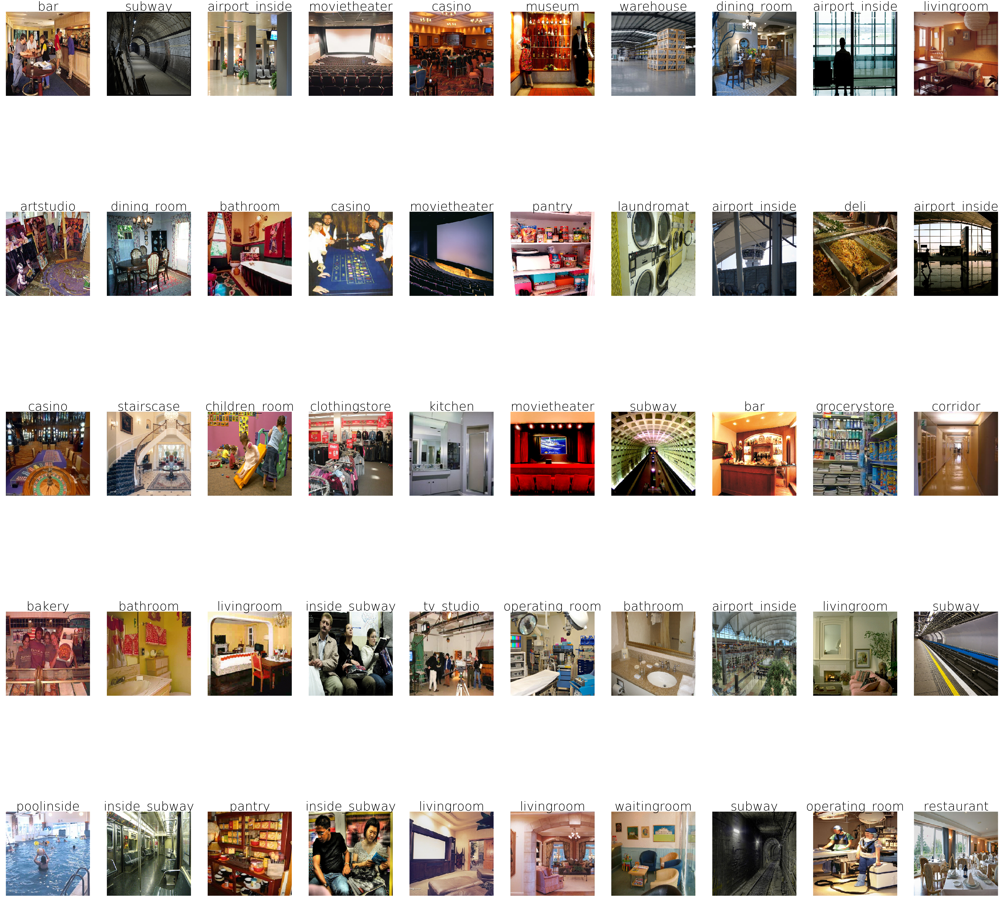

In [174]:
plots(imgs, titles=labels)

In [177]:
model = Sequential()
model.add(Conv2D(filters=32,kernel_size=3, strides=1, padding="same", activation="relu", input_shape=(224,224,3)))
model.add(MaxPooling2D(strides=2))
model.add(Conv2D(filters=64,kernel_size=3, strides=1, padding="same", activation="relu"))
model.add(MaxPooling2D(strides=2))

model.add(Conv2D(filters=128,kernel_size=3, strides=1, padding="same", activation="relu"))
model.add(MaxPooling2D(strides=2))
model.add(Flatten())
model.add(Dense(128))
model.add(Dropout(0.25))
model.add(Dense(67,activation="softmax"))

In [178]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 56, 56, 64)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 56, 56, 128)       73856     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 28, 28, 128)       0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 100352)            0         
__________

In [206]:
model.compile(optimizer="adam",loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.fit_generator(train_batches, steps_per_epoch=200, validation_data=valid_batches, validation_steps=100,
                   epochs=10, verbose=1)


Epoch 1/10
130/200 [==================>...........] - ETA: 2:13 - loss: 15.9240 - acc: 0.0120

In [ ]:
test_imgs, test_labels = next(test_batches)
plots(test_imgs, titles = test_labels)

In [ ]:
predictions = model.predict_generator(test_batches, steps=1, verbose = 0)